In [1]:
import os 
import cv2
import time 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as ans 
from tqdm import tqdm 
import shutil 
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import Model
from tensorflow.keras import layers 
from tensorflow.keras.layers import *
import tensorflow_datasets as tfds
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import *
from datetime import datetime
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import Dense, Input, UpSampling2D, Conv2DTranspose, Conv2D, add, Add,\
                    Lambda, Concatenate, AveragePooling2D, BatchNormalization, GlobalAveragePooling2D, \
                    Add, LayerNormalization, Activation, LeakyReLU, SeparableConv2D
try:
    import tensorflow_addons as tfa 
except:
    !pip install tensorflow_addons
    import tensorflow_addons as tfa
    from tensorflow_addons.layers import InstanceNormalization
try:
    import gdown 
except:
    !pip install gdown --quiet
    import gdown
    
try: 
    from imutils import paths 
except:
    !pip install imutils  --quiet
    from imutils import paths
from collections import defaultdict
from tqdm import tqdm
import PIL
import glob
from PIL import Image
import cv2

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
class UnsuuportedFileExtension(Exception):
    def __init__(self, message):
        self.message = message

        
class InitializationErro(Exception):
    def __init__(self, message):
        self.message = message
        

class DataLoader:
    def __init__(self, dname: str, resize_shape: int, batch_size: int):
        assert dname in ["lol"], "given dataset name is not valid, supported datasets are ['lol']"  
        assert type(resize_shape) == int, 'Unknown dtype for resize shape, needed Int' 
        assert type(batch_size) == int, 'Unknown dtype for batch_size, needed Int' 
        self.dname = dname 
        self.resize_shape = resize_shape
        self.batch_size = batch_size
    
    def initialize(self):
        try: 
            if self.dname == "lol":
                LOL_DATA_URL = 'https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6'
                if not os.path.exists('lol_dataset'):
                    gdown.download(LOL_DATA_URL, quiet=True)
                    os.system(f'unzip -q lol_dataset')

                if (os.path.exists("lol_dataset.zip") and not os.path.exists("lol_dataset")):
                    os.system(f'unzip -q lol_dataset')
                    
        except Exception as err:
            return err 
        
        else:
            self.train_data_path = os.path.join("lol_dataset", "our485", "low")
            self.val_data_path = os.path.join("lol_dataset", "eval15", 'low')
        
    def __preprocess_image(self, img_fpath): 
        try: 
            f_ext = None
            raw = tf.io.read_file(img_fpath)
            if f_ext == 'jpeg':
                image = tf.image.decode_jpeg(raw)
            if f_ext == 'png':
                image = tf.image.decode_png(raw)
            if f_ext == "jpg":
                image = tf.image.decode_jpeg(raw)
            else:
                image = tf.image.decode_png(raw)
            image = tf.image.convert_image_dtype(image, tf.float32)
            image = tf.image.resize(image, size=[self.resize_shape, self.resize_shape],
                                                        method=tf.image.ResizeMethod.BICUBIC)
            image = (image - tf.reduce_min(image)) / (tf.reduce_max(image) - tf.reduce_min(image))
            return image
            
        except Exception as err:
            return err
        
    def get_dataset(self, split_name):
        assert split_name in ("train", 'val'), "unsupported split type"
        try:
            if split_name == "train":
                train_files = list(paths.list_images(self.train_data_path))
                tf_ds = tf.data.Dataset.from_tensor_slices(train_files)
                tf_ds = tf_ds.map(self.__preprocess_image, num_parallel_calls=tf.data.AUTOTUNE).cache()
                tf_ds = tf_ds.shuffle(buffer_size=50)
                tf_ds = tf_ds.batch(self.batch_size)
                tf_ds = tf_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
                return tf_ds
            
            else:
                val_files = list(paths.list_images(self.val_data_path))
                tf_ds = tf.data.Dataset.from_tensor_slices(val_files)
                tf_ds = tf_ds.map(self.__preprocess_image, num_parallel_calls=tf.data.AUTOTUNE).cache()
                tf_ds = tf_ds.shuffle(buffer_size=5)
                tf_ds = tf_ds.batch(1)
                tf_ds = tf_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
                return tf_ds
                
        except Exception as err:
            raise InitializationErro('DataLoader, has not been initialize, use .initalize method')


In [3]:
dataloader = DataLoader(dname='lol', resize_shape=256, batch_size=32)
dataloader.initialize()

In [4]:
train_ds = dataloader.get_dataset(split_name="train")
train_ds

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>

In [5]:
val_ds = dataloader.get_dataset(split_name="val")
val_ds

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>

In [6]:
class ZeroDCENet(keras.Model):
    def __init__(self, n_filters):
        super(ZeroDCENet, self).__init__()
        
        self.conv_1 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_1")
        self.conv_2 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_2")
        self.conv_3 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_3")
        self.conv_4 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_4")
        self.conv_5 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_5")
        self.conv_6 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_6")
        # concatenation layer
        self.concat = Concatenate(axis=-1, name="concat_layer")
        self.A = Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same", name="curve_params")
        
    def call(self, input_img, training=False):
        conv_1 = self.conv_1(input_img)
        conv_2 = self.conv_2(conv_1)
        conv_3 = self.conv_3(conv_2)
        conv_4 = self.conv_4(conv_3)
        
        concat_1 = self.concat([conv_4, conv_3])
        conv_5 = self.conv_5(concat_1)
        
        concat_2 = self.concat([conv_5, conv_2])
        conv_6 = self.conv_6(concat_2)
        
        concat_3 = self.concat([conv_6, conv_1])
        A = self.A(concat_3)
        
        enchanced_image = self.gen_enchanced_image(input_img, A)
        
        if training:
            return enchanced_image, A
        return enchanced_image
    
    def gen_enchanced_image(self, input_img, curve_params):
        A = curve_params
        r1 = A[:,:,:,: 3]
        r2 = A[:,:,:,3: 6]
        r3 = A[:,:,:,6: 9]
        r4 = A[:,:,:,9: 12]
        r5 = A[:,:,:,12: 15]
        r6 = A[:,:,:,15: 18]
        r7 = A[:,:,:,18: 21]
        r8 = A[:,:,:,21: 24]
        
        x = input_img + r1 * (tf.pow(input_img, 2) - input_img)
        x = x + r2 * (tf.pow(x, 2) - x)
        x = x + r3 * (tf.pow(x, 2) - x)
        enhanced_image_1 = x + r4 * (tf.pow(x, 2) - x)
        x = enhanced_image_1 + r5*(tf.pow(enhanced_image_1, 2)-enhanced_image_1)		
        x = x + r6*(tf.pow(x, 2)-x)	
        x = x + r7*(tf.pow(x, 2)-x)
        enhanced_image = x + r8*(tf.pow(x, 2)-x)
        
        return enhanced_image

    def summary(self):
        inputs = Input(shape=(256, 256, 3))
        return Model(inputs=inputs, outputs=self.call(inputs)).summary()

In [ ]:
model = ZeroDCENet(32)
i, o = model(ar)

In [ ]:
model.summary()
#tf.keras.utils.plot_model(model, to_file="zero_dce.png")

In [7]:
def get_zero_dce(input_shape=(None, None, 3), n_filters=32):
    input_img = Input(shape=input_shape)
    
    conv_1 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_1")(input_img)
    conv_2 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_2")(conv_1)
    
    conv_3 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_3")(conv_2)
    conv_4 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_4")(conv_3)
    concat_1 = Concatenate(axis=-1)([conv_4, conv_3])
 
    conv_5 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_5")(concat_1)
    concat_2 = Concatenate(axis=-1)([conv_5, conv_2])
    
    conv_6 = Conv2D(n_filters, (3, 3), strides=(1, 1), activation="relu", padding="same", name="conv_6")(concat_2)
    concat_3 = Concatenate(axis=-1)([conv_6, conv_1])
    
    A = Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same", name="curve_params")(concat_3)
    
    r1 = A[:,:,:,: 3]
    r2 = A[:,:,:,3: 6]
    r3 = A[:,:,:,6: 9]
    r4 = A[:,:,:,9: 12]
    r5 = A[:,:,:,12: 15]
    r6 = A[:,:,:,15: 18]
    r7 = A[:,:,:,18: 21]
    r8 = A[:,:,:,21: 24]
        
    x = input_img + r1 * (tf.pow(input_img,2)-input_img)
    x = x + r2 * (tf.pow(x,2)-x)
    x = x + r3 * (tf.pow(x,2)-x)
    enhanced_image_1 = x + r4*(tf.pow(x,2)-x)
    x = enhanced_image_1 + r5*(tf.pow(enhanced_image_1,2)-enhanced_image_1)		
    x = x + r6*(tf.pow(x,2)-x)	
    x = x + r7*(tf.pow(x,2)-x)
    enhanced_image = x + r8*(tf.pow(x,2)-x)
        
    return Model(inputs=input_img, outputs=[enhanced_image, A])

In [ ]:
m = get_zero_dce()

In [ ]:
m.summary()

In [8]:
# loss 
class ColorConstancyLoss(keras.losses.Loss):
    def __init__(self):
        super(ColorConstancyLoss, self).__init__()
    
    def __call__(self, x):
        super.__call__()
        # mean value calculation of the image.
        rgb_mean = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
        red_mean = rgb_mean[:, :, :, 0]
        green_mean = rgb_mean[:, :, :, 1]
        blue_mean = rgb_mean[:, :, :, 2]
        
        diff_rb = tf.square(red_mean - blue_mean)
        diff_rg = tf.square(red_mean - green_mean)
        diff_gb = tf.square(green_mean - blue_mean)
        
        #squared differnece 
        diff_rb = tf.square(diff_rb)
        diff_rg = tf.square(diff_rg)
        diff_gb = tf.square(diff_gb)
        
        loss_val = tf.sqrt(diff_rb + diff_rg + diff_gb)
        return loss_val

In [ ]:
ar = np.zeros((1, 256, 256, 3))
color_c_l = ColorConstancyLoss()

color_c_l(ar)

In [9]:
class ExposureLoss(keras.losses.Loss):
    def __init__(self, mean_val):
        super(ExposureLoss, self).__init__()
        self.mean_val = mean_val
    
    def __call__(self, x):
        super.__call__()
        x = tf.reduce_mean(x, 3, keepdims=True)
        mean = AveragePooling2D(pool_size=16, strides=16)(x) # non overlap
        
        d = tf.reduce_mean(tf.pow(mean- self.mean_val, 2))
        
        return d

In [10]:
class IlluminationSmothnessLoss(keras.losses.Loss):
    def __init__(self, tvloss_weights=1):
        super(IlluminationSmothnessLoss, self).__init__()
        self.tvloss_weights = tvloss_weights
        
    def __call__(self, x):
        super.__call__()
        batch_size = tf.shape(x)[0]
        h_x = tf.shape(x)[1]
        w_x = tf.shape(x)[2]
        count_h = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
        count_w = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
        h_tv = tf.reduce_sum(tf.square((x[:, 1:, :, :] - x[:, : h_x - 1, :, :])))
        w_tv = tf.reduce_sum(tf.square((x[:, :, 1:, :] - x[:, :, : w_x - 1, :])))
        batch_size = tf.cast(batch_size, dtype=tf.float32)
        count_h = tf.cast(count_h, dtype=tf.float32)
        count_w = tf.cast(count_w, dtype=tf.float32)
        return 2 * (h_tv / count_h + w_tv / count_w) / batch_size

In [ ]:
ls_l = IlluminationSmothnessLoss()

In [ ]:
ls_l(o)

In [11]:
class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self):
        super(SpatialConsistencyLoss, self).__init__()
    
    def init_f_left(self, shape, dtype=None):
        ker = np.zeros(shape, dtype=None)
        ker[1][0] = -1
        ker[1][1] = 1
        return ker

    def init_f_right(self, shape, dtype=None):
        ker = np.zeros(shape, dtype=None)
        ker[1][2] = -1
        ker[1][1] = 1
        return ker

    def init_f_up(self, shape, dtype=None):
        ker = np.zeros(shape, dtype=None)
        ker[0][1] = -1
        ker[1][1] = 1
        return ker

    def init_f_down(self, shape, dtype=None):
        ker = np.zeros(shape, dtype=None)
        ker[2][1] = -1
        ker[1][1] = 1
        return ker
    
    
    def call(self, orginal, enchanced): 
        orginal_mean = tf.reduce_mean(orginal, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(enchanced, 3, keepdims=True)

        original_pool =  AveragePooling2D(pool_size=4)(orginal_mean)		
        enhanced_pool = AveragePooling2D(pool_size=4)(enhanced_mean)
        
        # original
        d_original_left = Conv2D(kernel_initializer=self.init_f_left, 
                                padding='same', kernel_size=(3,3), filters=1)(original_pool)
        d_original_right = Conv2D(kernel_initializer=self.init_f_right,
                                padding='same', kernel_size=(3,3), filters=1)(original_pool)
        d_original_up = Conv2D(kernel_initializer=self.init_f_up,
                                padding='same', kernel_size=(3,3), filters=1)(original_pool)
        d_original_down = Conv2D(kernel_initializer=self.init_f_down,
                                padding='same', kernel_size=(3,3), filters=1)(original_pool)
        
        # enchanced
        d_enhanced_letf = Conv2D(kernel_initializer=self.init_f_left,
                                padding='same', kernel_size=(3,3), filters=1)(enhanced_pool)
        d_enhanced_right = Conv2D(kernel_initializer=self.init_f_right,
                                padding='same', kernel_size=(3,3), filters=1)(enhanced_pool)
        d_enhanced_up = Conv2D(kernel_initializer=self.init_f_up,
                                padding='same', kernel_size=(3,3), filters=1)(enhanced_pool)
        d_enhanced_down = Conv2D(kernel_initializer=self.init_f_down,
                                padding='same', kernel_size=(3,3), filters=1)(enhanced_pool)

        d_left = tf.pow(d_original_left - d_enhanced_letf, 2)
        d_right = tf.pow(d_original_right - d_enhanced_right, 2)
        d_up = tf.pow(d_original_up - d_enhanced_up, 2)
        d_down = tf.pow(d_original_down - d_enhanced_down, 2)
        E = (d_left + d_right + d_up + d_down)

        return E

In [12]:
class Trainer:
    def __init__(self, model, optimizer, ckpt, ckpt_manager, epochs):
        self.model = model 
        self.ckpt = ckpt
        self.ckpt_manager = ckpt_manager
        self.epochs = epochs
        self.optimizer = optimizer
        
        self.spatial_consistency_loss_tracker = keras.metrics.Mean()
        self.color_constancy_loss_tracker = keras.metrics.Mean()
        self.exposure_loss_tracker = keras.metrics.Mean()
        self.illumination_smoothness_loss_tracker = keras.metrics.Mean()
        self.total_loss_tracker = keras.metrics.Mean()
        
        self.val_spatial_consistency_loss_tracker = keras.metrics.Mean()
        self.val_color_constancy_loss_tracker = keras.metrics.Mean()
        self.val_exposure_loss_tracker = keras.metrics.Mean()
        self.val_illumination_smoothness_loss_tracker = keras.metrics.Mean()
        self.val_total_loss_tracker = keras.metrics.Mean()
        
        self.spatial_consistency_loss_func = SpatialConsistencyLoss()
        self.color_constancy_loss_func = ColorConstancyLoss()
        self.exposure_loss_func = ExposureLoss(0.6)
        self.illumination_smoothness_loss_func = IlluminationSmothnessLoss()
        
        log_dir = 'loss/' + datetime.now().strftime("%Y%m%d-%H%M%S") + '/train'
        self.train_writer = tf.summary.create_file_writer(log_dir)
        
        log_dir = 'loss/' + datetime.now().strftime("%Y%m%d-%H%M%S") + '/val'
        self.val_writer = tf.summary.create_file_writer(log_dir)
    
    def train_step(self, image):
        
        with tf.GradientTape() as tape: 
            enchanced_image, A = self.model(image, training=True)
            loss_res = self.compute_loss(image, enchanced_image, A)
            spatial_constancy_loss, exposure_loss, illumination_loss, color_constancy_loss = loss_res
            total_loss = spatial_constancy_loss + exposure_loss + illumination_loss + color_constancy_loss
            
        params = self.model.trainable_weights
        grads = tape.gradient(total_loss, params)
        
        self.optimizer.apply_gradients(zip(grads, params))
        
        self.spatial_consistency_loss_tracker.update_state(spatial_constancy_loss)
        self.color_constancy_loss_tracker(color_constancy_loss)
        self.exposure_loss_tracker(exposure_loss)
        self.illumination_smoothness_loss_tracker(illumination_loss)
        self.total_loss_tracker(total_loss)
        
        loss_dict = {
            "total_loss": self.total_loss_tracker.result(),
            "exposure_loss": self.exposure_loss_tracker.result(),
            "color_constancy_loss": self.color_constancy_loss_tracker.result(), 
            "illumination_smoothness_loss": self.illumination_smoothness_loss_tracker.result(),
            "spatial_consistency_loss": self.spatial_consistency_loss_tracker.result()
        }
        
        return loss_dict
    
    def test_step(self, image):
        enchanced_image, A = self.model(image, training=True) 
        loss_res = self.compute_loss(image, enchanced_image, A)
        spatial_constancy_loss, exposure_loss, illumination_loss, color_constancy_loss = loss_res
        total_loss = spatial_constancy_loss + exposure_loss + illumination_loss + color_constancy_loss
        
        self.val_spatial_consistency_loss_tracker.update_state(spatial_constancy_loss)
        self.val_color_constancy_loss_tracker.update_state(color_constancy_loss)
        self.val_exposure_loss_tracker.update_state(exposure_loss)
        self.val_illumination_smoothness_loss_tracker.update_state(illumination_loss)
        self.val_total_loss_tracker.update_state(total_loss)
        
        loss_dict = {
            "total_loss": self.val_total_loss_tracker.result(),
            "exposure_loss": self.val_exposure_loss_tracker.result(),
            "color_constancy_loss": self.val_color_constancy_loss_tracker.result(), 
            "illumination_smoothness_loss": self.val_illumination_smoothness_loss_tracker.result(),
            "spatial_consistency_loss": self.val_spatial_consistency_loss_tracker.result()
        }
        
        return loss_dict
    
    def compute_loss(self, original, enchanced, curve_params):
        illumination_loss = 200 * self.illumination_smoothness_loss_func(curve_params)
        spatial_constancy_loss = tf.reduce_mean(
            self.spatial_consistency_loss_func(enchanced, original)
        )
        color_constancy_loss = 5 * tf.reduce_mean(self.color_constancy_loss_func(enchanced))
        exposure_loss = 10 * tf.reduce_mean(self.exposure_loss_func(enchanced)) 
        
        return spatial_constancy_loss, exposure_loss, illumination_loss, color_constancy_loss
    
    def load_weights(self, filepath="pretrained_weights/zero_dcenet.h5", by_name=False,
                                                                 skip_mismatch=False, options=None):
        self.model.build((1, 256, 256, 3))
        self.model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        ) 
    
    def save_weights(self, filepath="pretrained_weights/zero_dcenet.h5", overwrite=True,
                                                                     save_format=None, options=None):
        self.model.save_weights(
            filepath,  overwrite=overwrite,
            save_format=save_format,
            options=options
        ) 
    
    def train(self, train_ds, val_ds):
        history = defaultdict(list)
        
        self.ckpt.restore(self.ckpt_manager.latest_checkpoint)
        if self.ckpt_manager.latest_checkpoint:
            print("Restored from {}".format(self.ckpt_manager.latest_checkpoint))
        else:
            print("Initializing from scratch.")
        
        for epoch in range(self.epochs): 
            print(f"Epoch: {epoch}: ")
            for step, training_batch in tqdm(enumerate(train_ds), total=len(train_ds)): 
                loss_dict = self.train_step(training_batch)
                train_loss = loss_dict["total_loss"]
                exposure_loss = loss_dict["exposure_loss"]
                color_constancy_loss = loss_dict["color_constancy_loss"]
                illumination_smoothness_loss = loss_dict["illumination_smoothness_loss"]
                spatial_consistency_loss = loss_dict["spatial_consistency_loss"]

            for step, val_batch in enumerate(val_ds):
                val_loss_dict = self.test_step(val_batch)
                val_loss = val_loss_dict["total_loss"]
                val_exposure_loss = val_loss_dict["exposure_loss"]
                val_color_constancy_loss = val_loss_dict["color_constancy_loss"]
                val_illumination_smoothness_loss = val_loss_dict["illumination_smoothness_loss"]
                val_spatial_consistency_loss = val_loss_dict["spatial_consistency_loss"]
        
            self.ckpt.epoch.assign_add(1)
            history["train_loss"].append(train_loss) 
            history["val_loss"].append(val_loss) 
            history["exposure_loss"].append(exposure_loss) 
            history["val_exposure_loss"].append(val_exposure_loss) 
            history["color_constancy_loss"].append(color_constancy_loss) 
            history["val_color_constancy_loss"].append(val_color_constancy_loss) 
            history["illumination_smoothness_loss"].append(illumination_smoothness_loss) 
            history["val_illumination_smoothness_loss"].append(val_illumination_smoothness_loss) 
            history["spatial_consistency_loss"].append(spatial_consistency_loss) 
            history["val_spatial_consistency_loss"].append(val_spatial_consistency_loss) 
        
            with self.train_writer.as_default(step=epoch):
                tf.summary.scalar('train_loss', train_loss)
                tf.summary.scalar('exposure_loss', exposure_loss)
                tf.summary.scalar('color_constancy_loss', color_constancy_loss)
                tf.summary.scalar('illumination_smoothness_loss', illumination_smoothness_loss)
                tf.summary.scalar('spatial_consistency_loss', spatial_consistency_loss)

            with self.val_writer.as_default(step=epoch):
                tf.summary.scalar('val_loss', val_loss)
                tf.summary.scalar('val_exposure_loss', val_exposure_loss)
                tf.summary.scalar('val_color_constancy_loss', val_color_constancy_loss)
                tf.summary.scalar('val_illumination_smoothness_loss', val_illumination_smoothness_loss)
                tf.summary.scalar('val_spatial_consistency_loss', val_spatial_consistency_loss)
            
            print(f'train_loss: {train_loss}, exposure_loss: {exposure_loss}, color_constancy_loss: {color_constancy_loss}, illumination_smoothness_loss: {illumination_smoothness_loss}, spatial_consistency_loss: {spatial_consistency_loss}\n')
            print(f'val_loss: {val_loss}, val_exposure_loss: {val_exposure_loss}, val_color_constancy_loss: {val_color_constancy_loss}, val_illumination_smoothness_loss: {val_illumination_smoothness_loss}, val_spatial_consistency_loss: {val_spatial_consistency_loss}\n')
            
            if epoch %2 == 0: 
                save_path = self.ckpt_manager.save()
                
                print("Saved checkpoint for step {}: {}".format(int(self.ckpt.epoch), save_path))
            
            self.spatial_consistency_loss_tracker.reset_states()
            self.color_constancy_loss_tracker.reset_states()
            self.exposure_loss_tracker.reset_states()
            self.illumination_smoothness_loss_tracker.reset_states()
            self.total_loss_tracker.reset_states()

            self.val_spatial_consistency_loss_tracker.reset_states()
            self.val_color_constancy_loss_tracker.reset_states()
            self.val_exposure_loss_tracker.reset_states()
            self.val_illumination_smoothness_loss_tracker.reset_states()
            self.val_total_loss_tracker.reset_states()
            
        return model
    
    def compute_psnr(self):
        pass 

In [13]:
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model = ZeroDCENet(32)

checkpoint = tf.train.Checkpoint(optimizer=optimizer, model=model, epoch=tf.Variable(1))
manager = tf.train.CheckpointManager(
    checkpoint, directory="saved/zerodce_new", max_to_keep=5)
status = checkpoint.restore(manager.latest_checkpoint)

In [14]:
trainer = Trainer(model, optimizer, checkpoint, manager, 100)

In [15]:
trainer.train(train_ds, val_ds)
trainer.save_weights()

Restored from saved/zerodce_new/ckpt-33
Epoch: 0: 


100%|██████████| 16/16 [00:19<00:00,  1.23s/it]


train_loss: 0.5976697206497192, exposure_loss: 0.38377535343170166, color_constancy_loss: 0.05312228202819824, illumination_smoothness_loss: 0.14186108112335205, spatial_consistency_loss: 0.018911009654402733

val_loss: 0.570247232913971, val_exposure_loss: 0.35624662041664124, val_color_constancy_loss: 0.029652489349246025, val_illumination_smoothness_loss: 0.16574938595294952, val_spatial_consistency_loss: 0.01859859563410282

Saved checkpoint for step 66: saved/zerodce_new/ckpt-34
Epoch: 1: 


100%|██████████| 16/16 [00:05<00:00,  2.72it/s]


train_loss: 0.5868451595306396, exposure_loss: 0.37637460231781006, color_constancy_loss: 0.05304218456149101, illumination_smoothness_loss: 0.1385115534067154, spatial_consistency_loss: 0.018916798755526543

val_loss: 0.5675467252731323, val_exposure_loss: 0.3557805120944977, val_color_constancy_loss: 0.029597287997603416, val_illumination_smoothness_loss: 0.16347813606262207, val_spatial_consistency_loss: 0.01869070529937744

Epoch: 2: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.5779880881309509, exposure_loss: 0.3725838363170624, color_constancy_loss: 0.053491465747356415, illumination_smoothness_loss: 0.1327812671661377, spatial_consistency_loss: 0.01913156546652317

val_loss: 0.5655226111412048, val_exposure_loss: 0.3552652597427368, val_color_constancy_loss: 0.029715299606323242, val_illumination_smoothness_loss: 0.1617177575826645, val_spatial_consistency_loss: 0.018824322149157524

Saved checkpoint for step 68: saved/zerodce_new/ckpt-35
Epoch: 3: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5789545178413391, exposure_loss: 0.3734241724014282, color_constancy_loss: 0.05307241901755333, illumination_smoothness_loss: 0.1332780122756958, spatial_consistency_loss: 0.019179880619049072

val_loss: 0.5616809725761414, val_exposure_loss: 0.35452497005462646, val_color_constancy_loss: 0.029434936121106148, val_illumination_smoothness_loss: 0.1590530276298523, val_spatial_consistency_loss: 0.018668049946427345

Epoch: 4: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.5897281169891357, exposure_loss: 0.390014111995697, color_constancy_loss: 0.05296054109930992, illumination_smoothness_loss: 0.12799960374832153, spatial_consistency_loss: 0.018753811717033386

val_loss: 0.5585442185401917, val_exposure_loss: 0.35784292221069336, val_color_constancy_loss: 0.029767172411084175, val_illumination_smoothness_loss: 0.15196870267391205, val_spatial_consistency_loss: 0.01896544359624386

Saved checkpoint for step 70: saved/zerodce_new/ckpt-36
Epoch: 5: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5771118402481079, exposure_loss: 0.37395453453063965, color_constancy_loss: 0.05381182208657265, illumination_smoothness_loss: 0.12956339120864868, spatial_consistency_loss: 0.01978207379579544

val_loss: 0.5587751865386963, val_exposure_loss: 0.35432350635528564, val_color_constancy_loss: 0.0300331711769104, val_illumination_smoothness_loss: 0.155265673995018, val_spatial_consistency_loss: 0.019152849912643433

Epoch: 6: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5762743353843689, exposure_loss: 0.37978386878967285, color_constancy_loss: 0.05370868742465973, illumination_smoothness_loss: 0.12357144802808762, spatial_consistency_loss: 0.019210385158658028

val_loss: 0.5517966151237488, val_exposure_loss: 0.3561052978038788, val_color_constancy_loss: 0.029587503522634506, val_illumination_smoothness_loss: 0.1474127173423767, val_spatial_consistency_loss: 0.018691042438149452

Saved checkpoint for step 72: saved/zerodce_new/ckpt-37
Epoch: 7: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.5635656118392944, exposure_loss: 0.3704608380794525, color_constancy_loss: 0.05269775912165642, illumination_smoothness_loss: 0.1213228851556778, spatial_consistency_loss: 0.01908411830663681

val_loss: 0.5530828237533569, val_exposure_loss: 0.3539164364337921, val_color_constancy_loss: 0.029749300330877304, val_illumination_smoothness_loss: 0.15083831548690796, val_spatial_consistency_loss: 0.018578719347715378

Epoch: 8: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5605620741844177, exposure_loss: 0.3700079023838043, color_constancy_loss: 0.052507638931274414, illumination_smoothness_loss: 0.11902070045471191, spatial_consistency_loss: 0.019025882706046104

val_loss: 0.5484893918037415, val_exposure_loss: 0.3580172657966614, val_color_constancy_loss: 0.029807668179273605, val_illumination_smoothness_loss: 0.1416473090648651, val_spatial_consistency_loss: 0.01901714690029621

Saved checkpoint for step 74: saved/zerodce_new/ckpt-38
Epoch: 9: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.5657541155815125, exposure_loss: 0.3774648606777191, color_constancy_loss: 0.05092870444059372, illumination_smoothness_loss: 0.11783739179372787, spatial_consistency_loss: 0.01952321082353592

val_loss: 0.5485295057296753, val_exposure_loss: 0.35398709774017334, val_color_constancy_loss: 0.029751263558864594, val_illumination_smoothness_loss: 0.1458171010017395, val_spatial_consistency_loss: 0.018974045291543007

Epoch: 10: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.5676825642585754, exposure_loss: 0.3793502748012543, color_constancy_loss: 0.052217308431863785, illumination_smoothness_loss: 0.11693798750638962, spatial_consistency_loss: 0.019176935777068138

val_loss: 0.5410661101341248, val_exposure_loss: 0.35659950971603394, val_color_constancy_loss: 0.02934744767844677, val_illumination_smoothness_loss: 0.13631834089756012, val_spatial_consistency_loss: 0.018800785765051842

Saved checkpoint for step 76: saved/zerodce_new/ckpt-39
Epoch: 11: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5569049119949341, exposure_loss: 0.375188410282135, color_constancy_loss: 0.051470838487148285, illumination_smoothness_loss: 0.11099343001842499, spatial_consistency_loss: 0.019252285361289978

val_loss: 0.5409465432167053, val_exposure_loss: 0.3540922701358795, val_color_constancy_loss: 0.029446478933095932, val_illumination_smoothness_loss: 0.13859309256076813, val_spatial_consistency_loss: 0.01881464757025242

Epoch: 12: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.560886800289154, exposure_loss: 0.3751906156539917, color_constancy_loss: 0.052614059299230576, illumination_smoothness_loss: 0.11405781656503677, spatial_consistency_loss: 0.019024308770895004

val_loss: 0.5366469621658325, val_exposure_loss: 0.3561902344226837, val_color_constancy_loss: 0.02972450852394104, val_illumination_smoothness_loss: 0.13195069134235382, val_spatial_consistency_loss: 0.018781574442982674

Saved checkpoint for step 78: saved/zerodce_new/ckpt-40
Epoch: 13: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5620118379592896, exposure_loss: 0.3821515738964081, color_constancy_loss: 0.05152268707752228, illumination_smoothness_loss: 0.10904964059591293, spatial_consistency_loss: 0.019287925213575363

val_loss: 0.5392858982086182, val_exposure_loss: 0.35313206911087036, val_color_constancy_loss: 0.029775124043226242, val_illumination_smoothness_loss: 0.13759197294712067, val_spatial_consistency_loss: 0.01878671534359455

Epoch: 14: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.5582982301712036, exposure_loss: 0.37406259775161743, color_constancy_loss: 0.052741922438144684, illumination_smoothness_loss: 0.11250646412372589, spatial_consistency_loss: 0.01898723468184471

val_loss: 0.5324904322624207, val_exposure_loss: 0.35530298948287964, val_color_constancy_loss: 0.029924102127552032, val_illumination_smoothness_loss: 0.12858445942401886, val_spatial_consistency_loss: 0.018678875640034676

Saved checkpoint for step 80: saved/zerodce_new/ckpt-41
Epoch: 15: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.5612378120422363, exposure_loss: 0.3860863447189331, color_constancy_loss: 0.05195259302854538, illumination_smoothness_loss: 0.1040908694267273, spatial_consistency_loss: 0.01910807192325592

val_loss: 0.5310897827148438, val_exposure_loss: 0.35532811284065247, val_color_constancy_loss: 0.03012264519929886, val_illumination_smoothness_loss: 0.12664569914340973, val_spatial_consistency_loss: 0.018993299454450607

Epoch: 16: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5469509363174438, exposure_loss: 0.36948174238204956, color_constancy_loss: 0.053685445338487625, illumination_smoothness_loss: 0.10448139905929565, spatial_consistency_loss: 0.019302379339933395

val_loss: 0.529127299785614, val_exposure_loss: 0.35432252287864685, val_color_constancy_loss: 0.02969917468726635, val_illumination_smoothness_loss: 0.12626531720161438, val_spatial_consistency_loss: 0.018840210512280464

Saved checkpoint for step 82: saved/zerodce_new/ckpt-42
Epoch: 17: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.5466911196708679, exposure_loss: 0.37217867374420166, color_constancy_loss: 0.053484391421079636, illumination_smoothness_loss: 0.10197250545024872, spatial_consistency_loss: 0.019055482000112534

val_loss: 0.5262166261672974, val_exposure_loss: 0.3545529246330261, val_color_constancy_loss: 0.029916903004050255, val_illumination_smoothness_loss: 0.12302505224943161, val_spatial_consistency_loss: 0.01872173883020878

Epoch: 18: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.5508230328559875, exposure_loss: 0.37655550241470337, color_constancy_loss: 0.05346861854195595, illumination_smoothness_loss: 0.10162027180194855, spatial_consistency_loss: 0.01917867735028267

val_loss: 0.5268986821174622, val_exposure_loss: 0.3540191948413849, val_color_constancy_loss: 0.03004559688270092, val_illumination_smoothness_loss: 0.12401890754699707, val_spatial_consistency_loss: 0.018814971670508385

Saved checkpoint for step 84: saved/zerodce_new/ckpt-43
Epoch: 19: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5426045060157776, exposure_loss: 0.37465399503707886, color_constancy_loss: 0.05121636763215065, illumination_smoothness_loss: 0.09749540686607361, spatial_consistency_loss: 0.019238775596022606

val_loss: 0.5234879851341248, val_exposure_loss: 0.3569580912590027, val_color_constancy_loss: 0.02979375794529915, val_illumination_smoothness_loss: 0.11775963753461838, val_spatial_consistency_loss: 0.018976513296365738

Epoch: 20: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.5400175452232361, exposure_loss: 0.3714631199836731, color_constancy_loss: 0.05247362703084946, illumination_smoothness_loss: 0.0967591255903244, spatial_consistency_loss: 0.019321655854582787

val_loss: 0.5218178033828735, val_exposure_loss: 0.35378581285476685, val_color_constancy_loss: 0.02954277954995632, val_illumination_smoothness_loss: 0.11957044154405594, val_spatial_consistency_loss: 0.018918821588158607

Saved checkpoint for step 86: saved/zerodce_new/ckpt-44
Epoch: 21: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5413612127304077, exposure_loss: 0.3736332654953003, color_constancy_loss: 0.053502049297094345, illumination_smoothness_loss: 0.09509715437889099, spatial_consistency_loss: 0.019128700718283653

val_loss: 0.5179516077041626, val_exposure_loss: 0.3556274175643921, val_color_constancy_loss: 0.02922937646508217, val_illumination_smoothness_loss: 0.11424721032381058, val_spatial_consistency_loss: 0.01884761080145836

Epoch: 22: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.5367741584777832, exposure_loss: 0.3717932105064392, color_constancy_loss: 0.05363595485687256, illumination_smoothness_loss: 0.09203208982944489, spatial_consistency_loss: 0.019312817603349686

val_loss: 0.5160860419273376, val_exposure_loss: 0.35649242997169495, val_color_constancy_loss: 0.029406746849417686, val_illumination_smoothness_loss: 0.11106061190366745, val_spatial_consistency_loss: 0.01912628673017025

Saved checkpoint for step 88: saved/zerodce_new/ckpt-45
Epoch: 23: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5347964763641357, exposure_loss: 0.37140026688575745, color_constancy_loss: 0.053403738886117935, illumination_smoothness_loss: 0.09058842808008194, spatial_consistency_loss: 0.019404157996177673

val_loss: 0.515375018119812, val_exposure_loss: 0.35461941361427307, val_color_constancy_loss: 0.02978113293647766, val_illumination_smoothness_loss: 0.11200819164514542, val_spatial_consistency_loss: 0.01896626688539982

Epoch: 24: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5394776463508606, exposure_loss: 0.372439444065094, color_constancy_loss: 0.05301092565059662, illumination_smoothness_loss: 0.09458502382040024, spatial_consistency_loss: 0.019442254677414894

val_loss: 0.5132014155387878, val_exposure_loss: 0.3558763861656189, val_color_constancy_loss: 0.03015735372900963, val_illumination_smoothness_loss: 0.10818653553724289, val_spatial_consistency_loss: 0.01898115687072277

Saved checkpoint for step 90: saved/zerodce_new/ckpt-46
Epoch: 25: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5317439436912537, exposure_loss: 0.3732703924179077, color_constancy_loss: 0.051366597414016724, illumination_smoothness_loss: 0.0877397283911705, spatial_consistency_loss: 0.01936720870435238

val_loss: 0.5136868357658386, val_exposure_loss: 0.3542145788669586, val_color_constancy_loss: 0.030140357092022896, val_illumination_smoothness_loss: 0.11053315550088882, val_spatial_consistency_loss: 0.018798736855387688

Epoch: 26: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5426201820373535, exposure_loss: 0.3813454508781433, color_constancy_loss: 0.05312185361981392, illumination_smoothness_loss: 0.08922335505485535, spatial_consistency_loss: 0.01892950013279915

val_loss: 0.5124946236610413, val_exposure_loss: 0.35755521059036255, val_color_constancy_loss: 0.0299574825912714, val_illumination_smoothness_loss: 0.10602295398712158, val_spatial_consistency_loss: 0.018958989530801773

Saved checkpoint for step 92: saved/zerodce_new/ckpt-47
Epoch: 27: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.5302065014839172, exposure_loss: 0.3694576919078827, color_constancy_loss: 0.05286410450935364, illumination_smoothness_loss: 0.08838499337434769, spatial_consistency_loss: 0.01949968934059143

val_loss: 0.5093708634376526, val_exposure_loss: 0.35514119267463684, val_color_constancy_loss: 0.03004421480000019, val_illumination_smoothness_loss: 0.10512767732143402, val_spatial_consistency_loss: 0.01905771903693676

Epoch: 28: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.5284528732299805, exposure_loss: 0.3715149164199829, color_constancy_loss: 0.05127325281500816, illumination_smoothness_loss: 0.0861840695142746, spatial_consistency_loss: 0.01948058046400547

val_loss: 0.5070292353630066, val_exposure_loss: 0.3540947139263153, val_color_constancy_loss: 0.02957608923316002, val_illumination_smoothness_loss: 0.10446484386920929, val_spatial_consistency_loss: 0.01889350637793541

Saved checkpoint for step 94: saved/zerodce_new/ckpt-48
Epoch: 29: 


100%|██████████| 16/16 [00:05<00:00,  2.73it/s]


train_loss: 0.5422577261924744, exposure_loss: 0.3859017789363861, color_constancy_loss: 0.052449606359004974, illumination_smoothness_loss: 0.08477827161550522, spatial_consistency_loss: 0.01912803016602993

val_loss: 0.5048637986183167, val_exposure_loss: 0.3546343147754669, val_color_constancy_loss: 0.02954030968248844, val_illumination_smoothness_loss: 0.10184281319379807, val_spatial_consistency_loss: 0.01884634420275688

Epoch: 30: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5276565551757812, exposure_loss: 0.37121477723121643, color_constancy_loss: 0.056507911533117294, illumination_smoothness_loss: 0.08071672171354294, spatial_consistency_loss: 0.019217129796743393

val_loss: 0.5035039782524109, val_exposure_loss: 0.35524362325668335, val_color_constancy_loss: 0.029756758362054825, val_illumination_smoothness_loss: 0.0994420275092125, val_spatial_consistency_loss: 0.019061561673879623

Saved checkpoint for step 96: saved/zerodce_new/ckpt-49
Epoch: 31: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5260666012763977, exposure_loss: 0.3745569884777069, color_constancy_loss: 0.05079774931073189, illumination_smoothness_loss: 0.08126085251569748, spatial_consistency_loss: 0.019450992345809937

val_loss: 0.5034412145614624, val_exposure_loss: 0.3553225100040436, val_color_constancy_loss: 0.03042072057723999, val_illumination_smoothness_loss: 0.09861886501312256, val_spatial_consistency_loss: 0.019079100340604782

Epoch: 32: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.5207359194755554, exposure_loss: 0.3674866557121277, color_constancy_loss: 0.052426550537347794, illumination_smoothness_loss: 0.08133691549301147, spatial_consistency_loss: 0.019485751166939735

val_loss: 0.500623881816864, val_exposure_loss: 0.3555466830730438, val_color_constancy_loss: 0.030155466869473457, val_illumination_smoothness_loss: 0.09583812206983566, val_spatial_consistency_loss: 0.019083570688962936

Saved checkpoint for step 98: saved/zerodce_new/ckpt-50
Epoch: 33: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.5242992639541626, exposure_loss: 0.3737088143825531, color_constancy_loss: 0.051400475203990936, illumination_smoothness_loss: 0.07978824526071548, spatial_consistency_loss: 0.01940178871154785

val_loss: 0.4991002082824707, val_exposure_loss: 0.3559547960758209, val_color_constancy_loss: 0.030049260705709457, val_illumination_smoothness_loss: 0.09405267238616943, val_spatial_consistency_loss: 0.019043486565351486

Epoch: 34: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5242310166358948, exposure_loss: 0.37508517503738403, color_constancy_loss: 0.05104118213057518, illumination_smoothness_loss: 0.07871626317501068, spatial_consistency_loss: 0.019388385117053986

val_loss: 0.4986679255962372, val_exposure_loss: 0.35441768169403076, val_color_constancy_loss: 0.029973627999424934, val_illumination_smoothness_loss: 0.09533526748418808, val_spatial_consistency_loss: 0.018941400572657585

Saved checkpoint for step 100: saved/zerodce_new/ckpt-51
Epoch: 35: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5216085910797119, exposure_loss: 0.3741728961467743, color_constancy_loss: 0.05122535303235054, illumination_smoothness_loss: 0.07695897668600082, spatial_consistency_loss: 0.019251329824328423

val_loss: 0.4958644211292267, val_exposure_loss: 0.3550237715244293, val_color_constancy_loss: 0.029696526005864143, val_illumination_smoothness_loss: 0.09226168692111969, val_spatial_consistency_loss: 0.018882425501942635

Epoch: 36: 


100%|██████████| 16/16 [00:05<00:00,  2.72it/s]


train_loss: 0.5222090482711792, exposure_loss: 0.37441688776016235, color_constancy_loss: 0.05141165852546692, illumination_smoothness_loss: 0.07697896659374237, spatial_consistency_loss: 0.019401518628001213

val_loss: 0.49539273977279663, val_exposure_loss: 0.3546074628829956, val_color_constancy_loss: 0.029720501974225044, val_illumination_smoothness_loss: 0.09219084680080414, val_spatial_consistency_loss: 0.018873941153287888

Saved checkpoint for step 102: saved/zerodce_new/ckpt-52
Epoch: 37: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.5182485580444336, exposure_loss: 0.371080219745636, color_constancy_loss: 0.05223393440246582, illumination_smoothness_loss: 0.07574373483657837, spatial_consistency_loss: 0.019190732389688492

val_loss: 0.49316781759262085, val_exposure_loss: 0.3548702597618103, val_color_constancy_loss: 0.02953498438000679, val_illumination_smoothness_loss: 0.08991941809654236, val_spatial_consistency_loss: 0.018843181431293488

Epoch: 38: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5220757126808167, exposure_loss: 0.37603041529655457, color_constancy_loss: 0.05207221210002899, illumination_smoothness_loss: 0.07485809177160263, spatial_consistency_loss: 0.019114969298243523

val_loss: 0.49235042929649353, val_exposure_loss: 0.3544808030128479, val_color_constancy_loss: 0.0295407697558403, val_illumination_smoothness_loss: 0.08948042243719101, val_spatial_consistency_loss: 0.018848378211259842

Saved checkpoint for step 104: saved/zerodce_new/ckpt-53
Epoch: 39: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.5256638526916504, exposure_loss: 0.3841880261898041, color_constancy_loss: 0.05015087500214577, illumination_smoothness_loss: 0.07211928814649582, spatial_consistency_loss: 0.019205713644623756

val_loss: 0.49190548062324524, val_exposure_loss: 0.353878915309906, val_color_constancy_loss: 0.0293271467089653, val_illumination_smoothness_loss: 0.08985412865877151, val_spatial_consistency_loss: 0.018845250830054283

Epoch: 40: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.5151549577713013, exposure_loss: 0.37153950333595276, color_constancy_loss: 0.05196976289153099, illumination_smoothness_loss: 0.07236271351575851, spatial_consistency_loss: 0.019282925873994827

val_loss: 0.49046915769577026, val_exposure_loss: 0.3529421389102936, val_color_constancy_loss: 0.0293694157153368, val_illumination_smoothness_loss: 0.0895574539899826, val_spatial_consistency_loss: 0.018600063398480415

Saved checkpoint for step 106: saved/zerodce_new/ckpt-54
Epoch: 41: 


100%|██████████| 16/16 [00:05<00:00,  2.85it/s]


train_loss: 0.5147219896316528, exposure_loss: 0.3711231052875519, color_constancy_loss: 0.05424334481358528, illumination_smoothness_loss: 0.07036738842725754, spatial_consistency_loss: 0.01898818649351597

val_loss: 0.48950323462486267, val_exposure_loss: 0.35356488823890686, val_color_constancy_loss: 0.02981751412153244, val_illumination_smoothness_loss: 0.0875181257724762, val_spatial_consistency_loss: 0.018602663651108742

Epoch: 42: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.515400767326355, exposure_loss: 0.37333425879478455, color_constancy_loss: 0.05230659618973732, illumination_smoothness_loss: 0.07092643529176712, spatial_consistency_loss: 0.01883343607187271

val_loss: 0.48768749833106995, val_exposure_loss: 0.35664865374565125, val_color_constancy_loss: 0.029957300052046776, val_illumination_smoothness_loss: 0.0820789784193039, val_spatial_consistency_loss: 0.019002484157681465

Saved checkpoint for step 108: saved/zerodce_new/ckpt-55
Epoch: 43: 


100%|██████████| 16/16 [00:05<00:00,  2.84it/s]


train_loss: 0.5066959261894226, exposure_loss: 0.3694811463356018, color_constancy_loss: 0.05066470056772232, illumination_smoothness_loss: 0.0669831782579422, spatial_consistency_loss: 0.019566886126995087

val_loss: 0.48933935165405273, val_exposure_loss: 0.3534509539604187, val_color_constancy_loss: 0.029842177405953407, val_illumination_smoothness_loss: 0.08690442889928818, val_spatial_consistency_loss: 0.019141817465424538

Epoch: 44: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5130936503410339, exposure_loss: 0.3735027313232422, color_constancy_loss: 0.051008012145757675, illumination_smoothness_loss: 0.06937647610902786, spatial_consistency_loss: 0.019206512719392776

val_loss: 0.48591288924217224, val_exposure_loss: 0.3562251925468445, val_color_constancy_loss: 0.029557490721344948, val_illumination_smoothness_loss: 0.08118347823619843, val_spatial_consistency_loss: 0.018946686759591103

Saved checkpoint for step 110: saved/zerodce_new/ckpt-56
Epoch: 45: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5218437314033508, exposure_loss: 0.38325345516204834, color_constancy_loss: 0.05167151987552643, illumination_smoothness_loss: 0.06762318313121796, spatial_consistency_loss: 0.019295584410429

val_loss: 0.48530465364456177, val_exposure_loss: 0.3531646728515625, val_color_constancy_loss: 0.02949053980410099, val_illumination_smoothness_loss: 0.08372419327497482, val_spatial_consistency_loss: 0.018925238400697708

Epoch: 46: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5151413679122925, exposure_loss: 0.37810441851615906, color_constancy_loss: 0.05055658519268036, illumination_smoothness_loss: 0.06721189618110657, spatial_consistency_loss: 0.01926853321492672

val_loss: 0.48305246233940125, val_exposure_loss: 0.35365477204322815, val_color_constancy_loss: 0.029367735609412193, val_illumination_smoothness_loss: 0.08134026825428009, val_spatial_consistency_loss: 0.018689624965190887

Saved checkpoint for step 112: saved/zerodce_new/ckpt-57
Epoch: 47: 


100%|██████████| 16/16 [00:05<00:00,  2.84it/s]


train_loss: 0.5154532790184021, exposure_loss: 0.3752417266368866, color_constancy_loss: 0.052939753979444504, illumination_smoothness_loss: 0.06837143748998642, spatial_consistency_loss: 0.01890028826892376

val_loss: 0.48231491446495056, val_exposure_loss: 0.35558822751045227, val_color_constancy_loss: 0.029187871143221855, val_illumination_smoothness_loss: 0.07868506014347076, val_spatial_consistency_loss: 0.018853789195418358

Epoch: 48: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5120097994804382, exposure_loss: 0.37504661083221436, color_constancy_loss: 0.05280296131968498, illumination_smoothness_loss: 0.06490923464298248, spatial_consistency_loss: 0.019251028075814247

val_loss: 0.48296022415161133, val_exposure_loss: 0.35285186767578125, val_color_constancy_loss: 0.029264815151691437, val_illumination_smoothness_loss: 0.08202023804187775, val_spatial_consistency_loss: 0.018823252990841866

Saved checkpoint for step 114: saved/zerodce_new/ckpt-58
Epoch: 49: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.5110628008842468, exposure_loss: 0.3733503818511963, color_constancy_loss: 0.05345993861556053, illumination_smoothness_loss: 0.06520752608776093, spatial_consistency_loss: 0.019044939428567886

val_loss: 0.47966477274894714, val_exposure_loss: 0.35360923409461975, val_color_constancy_loss: 0.029536208137869835, val_illumination_smoothness_loss: 0.07780206948518753, val_spatial_consistency_loss: 0.018717242404818535

Epoch: 50: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.5127493143081665, exposure_loss: 0.3806585967540741, color_constancy_loss: 0.05097467452287674, illumination_smoothness_loss: 0.06217007339000702, spatial_consistency_loss: 0.018945910036563873

val_loss: 0.4785185754299164, val_exposure_loss: 0.3558600842952728, val_color_constancy_loss: 0.029771728441119194, val_illumination_smoothness_loss: 0.0741092786192894, val_spatial_consistency_loss: 0.01877746731042862

Saved checkpoint for step 116: saved/zerodce_new/ckpt-59
Epoch: 51: 


100%|██████████| 16/16 [00:05<00:00,  2.74it/s]


train_loss: 0.5072502493858337, exposure_loss: 0.375757098197937, color_constancy_loss: 0.050981566309928894, illumination_smoothness_loss: 0.06126580387353897, spatial_consistency_loss: 0.019245831295847893

val_loss: 0.47877416014671326, val_exposure_loss: 0.35312074422836304, val_color_constancy_loss: 0.02960697002708912, val_illumination_smoothness_loss: 0.07707630842924118, val_spatial_consistency_loss: 0.018970167264342308

Epoch: 52: 


100%|██████████| 16/16 [00:05<00:00,  2.85it/s]


train_loss: 0.5038387775421143, exposure_loss: 0.3723505735397339, color_constancy_loss: 0.05126706510782242, illumination_smoothness_loss: 0.0609574019908905, spatial_consistency_loss: 0.01926375739276409

val_loss: 0.4762359857559204, val_exposure_loss: 0.35421222448349, val_color_constancy_loss: 0.029166579246520996, val_illumination_smoothness_loss: 0.07401999086141586, val_spatial_consistency_loss: 0.018837129697203636

Saved checkpoint for step 118: saved/zerodce_new/ckpt-60
Epoch: 53: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.4987248480319977, exposure_loss: 0.36757564544677734, color_constancy_loss: 0.05183214694261551, illumination_smoothness_loss: 0.060110390186309814, spatial_consistency_loss: 0.019206661731004715

val_loss: 0.4770053029060364, val_exposure_loss: 0.3527325987815857, val_color_constancy_loss: 0.029368462041020393, val_illumination_smoothness_loss: 0.07607589662075043, val_spatial_consistency_loss: 0.018828338012099266

Epoch: 54: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5097745060920715, exposure_loss: 0.37908515334129333, color_constancy_loss: 0.05087326467037201, illumination_smoothness_loss: 0.06049412116408348, spatial_consistency_loss: 0.019321942701935768

val_loss: 0.4799270033836365, val_exposure_loss: 0.3510601818561554, val_color_constancy_loss: 0.02968415804207325, val_illumination_smoothness_loss: 0.0804922878742218, val_spatial_consistency_loss: 0.018690431490540504

Saved checkpoint for step 120: saved/zerodce_new/ckpt-61
Epoch: 55: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.5036961436271667, exposure_loss: 0.37257081270217896, color_constancy_loss: 0.05024297535419464, illumination_smoothness_loss: 0.061873093247413635, spatial_consistency_loss: 0.019009264186024666

val_loss: 0.4745802581310272, val_exposure_loss: 0.35285380482673645, val_color_constancy_loss: 0.029535774141550064, val_illumination_smoothness_loss: 0.0737428292632103, val_spatial_consistency_loss: 0.018447857350111008

Epoch: 56: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5022933483123779, exposure_loss: 0.3718453049659729, color_constancy_loss: 0.051919061690568924, illumination_smoothness_loss: 0.05956432968378067, spatial_consistency_loss: 0.018964698538184166

val_loss: 0.4738427996635437, val_exposure_loss: 0.35323771834373474, val_color_constancy_loss: 0.02948157861828804, val_illumination_smoothness_loss: 0.07256791740655899, val_spatial_consistency_loss: 0.01855560764670372

Saved checkpoint for step 122: saved/zerodce_new/ckpt-62
Epoch: 57: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5015200972557068, exposure_loss: 0.3720587491989136, color_constancy_loss: 0.05078250914812088, illumination_smoothness_loss: 0.059702660888433456, spatial_consistency_loss: 0.018976150080561638

val_loss: 0.4718848764896393, val_exposure_loss: 0.3547789752483368, val_color_constancy_loss: 0.02956363745033741, val_illumination_smoothness_loss: 0.0688653290271759, val_spatial_consistency_loss: 0.01867690496146679

Epoch: 58: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.4957658648490906, exposure_loss: 0.3700682818889618, color_constancy_loss: 0.0505293570458889, illumination_smoothness_loss: 0.05599858984351158, spatial_consistency_loss: 0.01916959136724472

val_loss: 0.47143808007240295, val_exposure_loss: 0.3541516959667206, val_color_constancy_loss: 0.029626253992319107, val_illumination_smoothness_loss: 0.0687716007232666, val_spatial_consistency_loss: 0.018888480961322784

Saved checkpoint for step 124: saved/zerodce_new/ckpt-63
Epoch: 59: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5071427226066589, exposure_loss: 0.3800470232963562, color_constancy_loss: 0.05257115513086319, illumination_smoothness_loss: 0.05539236590266228, spatial_consistency_loss: 0.019132163375616074

val_loss: 0.4706295430660248, val_exposure_loss: 0.3538528084754944, val_color_constancy_loss: 0.029736675322055817, val_illumination_smoothness_loss: 0.06818488240242004, val_spatial_consistency_loss: 0.018855134025216103

Epoch: 60: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.4973866045475006, exposure_loss: 0.37259039282798767, color_constancy_loss: 0.051633287221193314, illumination_smoothness_loss: 0.054121438413858414, spatial_consistency_loss: 0.01904141530394554

val_loss: 0.46992167830467224, val_exposure_loss: 0.3549559712409973, val_color_constancy_loss: 0.0298461876809597, val_illumination_smoothness_loss: 0.06613396108150482, val_spatial_consistency_loss: 0.018985658884048462

Saved checkpoint for step 126: saved/zerodce_new/ckpt-64
Epoch: 61: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5046336650848389, exposure_loss: 0.38002654910087585, color_constancy_loss: 0.05059254169464111, illumination_smoothness_loss: 0.05459319055080414, spatial_consistency_loss: 0.019421380013227463

val_loss: 0.46989887952804565, val_exposure_loss: 0.35289251804351807, val_color_constancy_loss: 0.02966107241809368, val_illumination_smoothness_loss: 0.06832428276538849, val_spatial_consistency_loss: 0.01902100443840027

Epoch: 62: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.5022314190864563, exposure_loss: 0.37683388590812683, color_constancy_loss: 0.05132222920656204, illumination_smoothness_loss: 0.05491449311375618, spatial_consistency_loss: 0.019160835072398186

val_loss: 0.46851250529289246, val_exposure_loss: 0.35361602902412415, val_color_constancy_loss: 0.029439827427268028, val_illumination_smoothness_loss: 0.06677892804145813, val_spatial_consistency_loss: 0.018677672371268272

Saved checkpoint for step 128: saved/zerodce_new/ckpt-65
Epoch: 63: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.49283942580223083, exposure_loss: 0.36946216225624084, color_constancy_loss: 0.05087573453783989, illumination_smoothness_loss: 0.053135812282562256, spatial_consistency_loss: 0.019365698099136353

val_loss: 0.4677867591381073, val_exposure_loss: 0.35398516058921814, val_color_constancy_loss: 0.02951139397919178, val_illumination_smoothness_loss: 0.06533317267894745, val_spatial_consistency_loss: 0.01895703189074993

Epoch: 64: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5081121921539307, exposure_loss: 0.381872296333313, color_constancy_loss: 0.05400935560464859, illumination_smoothness_loss: 0.053192172199487686, spatial_consistency_loss: 0.019038299098610878

val_loss: 0.4661831259727478, val_exposure_loss: 0.3542349934577942, val_color_constancy_loss: 0.02941405400633812, val_illumination_smoothness_loss: 0.06378383189439774, val_spatial_consistency_loss: 0.018750280141830444

Saved checkpoint for step 130: saved/zerodce_new/ckpt-66
Epoch: 65: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.5020043849945068, exposure_loss: 0.3768685758113861, color_constancy_loss: 0.05323873460292816, illumination_smoothness_loss: 0.05268590897321701, spatial_consistency_loss: 0.019211187958717346

val_loss: 0.46769580245018005, val_exposure_loss: 0.35200366377830505, val_color_constancy_loss: 0.029475705698132515, val_illumination_smoothness_loss: 0.06744677573442459, val_spatial_consistency_loss: 0.018769629299640656

Epoch: 66: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.5004143118858337, exposure_loss: 0.3781149387359619, color_constancy_loss: 0.0513215996325016, illumination_smoothness_loss: 0.05194910988211632, spatial_consistency_loss: 0.019028756767511368

val_loss: 0.46585723757743835, val_exposure_loss: 0.35253143310546875, val_color_constancy_loss: 0.02935398742556572, val_illumination_smoothness_loss: 0.06530759483575821, val_spatial_consistency_loss: 0.01866423524916172

Saved checkpoint for step 132: saved/zerodce_new/ckpt-67
Epoch: 67: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.4969991147518158, exposure_loss: 0.3740616738796234, color_constancy_loss: 0.05243496596813202, illumination_smoothness_loss: 0.051402684301137924, spatial_consistency_loss: 0.019099794328212738

val_loss: 0.46514692902565, val_exposure_loss: 0.35286515951156616, val_color_constancy_loss: 0.02948712930083275, val_illumination_smoothness_loss: 0.06408200412988663, val_spatial_consistency_loss: 0.018712656572461128

Epoch: 68: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.4956645965576172, exposure_loss: 0.3718765676021576, color_constancy_loss: 0.05332687497138977, illumination_smoothness_loss: 0.05147138610482216, spatial_consistency_loss: 0.018989823758602142

val_loss: 0.4637698829174042, val_exposure_loss: 0.3540221154689789, val_color_constancy_loss: 0.029509244486689568, val_illumination_smoothness_loss: 0.06137114763259888, val_spatial_consistency_loss: 0.018867390230298042

Saved checkpoint for step 134: saved/zerodce_new/ckpt-68
Epoch: 69: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.4998161196708679, exposure_loss: 0.3788934350013733, color_constancy_loss: 0.051465954631567, illumination_smoothness_loss: 0.050336118787527084, spatial_consistency_loss: 0.01912063919007778

val_loss: 0.46395090222358704, val_exposure_loss: 0.3523317277431488, val_color_constancy_loss: 0.02927551046013832, val_illumination_smoothness_loss: 0.06368916481733322, val_spatial_consistency_loss: 0.018654508516192436

Epoch: 70: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.5025839805603027, exposure_loss: 0.3816750943660736, color_constancy_loss: 0.051518481224775314, illumination_smoothness_loss: 0.050516560673713684, spatial_consistency_loss: 0.018873823806643486

val_loss: 0.46188610792160034, val_exposure_loss: 0.35492947697639465, val_color_constancy_loss: 0.029134606942534447, val_illumination_smoothness_loss: 0.0591706745326519, val_spatial_consistency_loss: 0.018651312217116356

Saved checkpoint for step 136: saved/zerodce_new/ckpt-69
Epoch: 71: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.49403274059295654, exposure_loss: 0.37427470088005066, color_constancy_loss: 0.050862450152635574, illumination_smoothness_loss: 0.04970662668347359, spatial_consistency_loss: 0.019188925623893738

val_loss: 0.4632602035999298, val_exposure_loss: 0.35262981057167053, val_color_constancy_loss: 0.029501739889383316, val_illumination_smoothness_loss: 0.06226127967238426, val_spatial_consistency_loss: 0.018867410719394684

Epoch: 72: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.5018813014030457, exposure_loss: 0.3809773325920105, color_constancy_loss: 0.05355927720665932, illumination_smoothness_loss: 0.04815848916769028, spatial_consistency_loss: 0.01918618381023407

val_loss: 0.46182897686958313, val_exposure_loss: 0.35487377643585205, val_color_constancy_loss: 0.02959287539124489, val_illumination_smoothness_loss: 0.05844929441809654, val_spatial_consistency_loss: 0.018913058564066887

Saved checkpoint for step 138: saved/zerodce_new/ckpt-70
Epoch: 73: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.49667972326278687, exposure_loss: 0.37596702575683594, color_constancy_loss: 0.05265326797962189, illumination_smoothness_loss: 0.04870040342211723, spatial_consistency_loss: 0.019359050318598747

val_loss: 0.4609927237033844, val_exposure_loss: 0.35373565554618835, val_color_constancy_loss: 0.029708759859204292, val_illumination_smoothness_loss: 0.05857016146183014, val_spatial_consistency_loss: 0.018978122621774673

Epoch: 74: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.49455928802490234, exposure_loss: 0.37784963846206665, color_constancy_loss: 0.05079026520252228, illumination_smoothness_loss: 0.04682503268122673, spatial_consistency_loss: 0.019094403833150864

val_loss: 0.45941781997680664, val_exposure_loss: 0.3559153378009796, val_color_constancy_loss: 0.029298750683665276, val_illumination_smoothness_loss: 0.05527374893426895, val_spatial_consistency_loss: 0.018930023536086082

Saved checkpoint for step 140: saved/zerodce_new/ckpt-71
Epoch: 75: 


100%|██████████| 16/16 [00:05<00:00,  2.73it/s]


train_loss: 0.4937053918838501, exposure_loss: 0.3768182098865509, color_constancy_loss: 0.05002531409263611, illumination_smoothness_loss: 0.047461725771427155, spatial_consistency_loss: 0.019400114193558693

val_loss: 0.46010884642601013, val_exposure_loss: 0.35302841663360596, val_color_constancy_loss: 0.02945336513221264, val_illumination_smoothness_loss: 0.05880511924624443, val_spatial_consistency_loss: 0.018821893259882927

Epoch: 76: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.49275296926498413, exposure_loss: 0.3726687431335449, color_constancy_loss: 0.05487661808729172, illumination_smoothness_loss: 0.046262238174676895, spatial_consistency_loss: 0.018945354968309402

val_loss: 0.45793965458869934, val_exposure_loss: 0.3540940582752228, val_color_constancy_loss: 0.02950308844447136, val_illumination_smoothness_loss: 0.05566288158297539, val_spatial_consistency_loss: 0.01867961511015892

Saved checkpoint for step 142: saved/zerodce_new/ckpt-72
Epoch: 77: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.48783257603645325, exposure_loss: 0.3718228340148926, color_constancy_loss: 0.05207541957497597, illumination_smoothness_loss: 0.0448685847222805, spatial_consistency_loss: 0.01906573586165905

val_loss: 0.45800501108169556, val_exposure_loss: 0.35391679406166077, val_color_constancy_loss: 0.029723305255174637, val_illumination_smoothness_loss: 0.055446069687604904, val_spatial_consistency_loss: 0.018918870016932487

Epoch: 78: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.5012664198875427, exposure_loss: 0.38417574763298035, color_constancy_loss: 0.05136929824948311, illumination_smoothness_loss: 0.04651219770312309, spatial_consistency_loss: 0.01920919679105282

val_loss: 0.4590488076210022, val_exposure_loss: 0.351680189371109, val_color_constancy_loss: 0.03016619198024273, val_illumination_smoothness_loss: 0.05839620530605316, val_spatial_consistency_loss: 0.01880623586475849

Saved checkpoint for step 144: saved/zerodce_new/ckpt-73
Epoch: 79: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.49212706089019775, exposure_loss: 0.3773086965084076, color_constancy_loss: 0.05007224902510643, illumination_smoothness_loss: 0.04534705728292465, spatial_consistency_loss: 0.019399037584662437

val_loss: 0.46141862869262695, val_exposure_loss: 0.35112184286117554, val_color_constancy_loss: 0.029945876449346542, val_illumination_smoothness_loss: 0.06167200580239296, val_spatial_consistency_loss: 0.018678879365324974

Epoch: 80: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.48792821168899536, exposure_loss: 0.36964550614356995, color_constancy_loss: 0.05263461172580719, illumination_smoothness_loss: 0.046585939824581146, spatial_consistency_loss: 0.0190621018409729

val_loss: 0.4556978940963745, val_exposure_loss: 0.3545738756656647, val_color_constancy_loss: 0.029628627002239227, val_illumination_smoothness_loss: 0.05287961661815643, val_spatial_consistency_loss: 0.018615728244185448

Saved checkpoint for step 146: saved/zerodce_new/ckpt-74
Epoch: 81: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.4871675372123718, exposure_loss: 0.37073761224746704, color_constancy_loss: 0.05176633223891258, illumination_smoothness_loss: 0.04578499495983124, spatial_consistency_loss: 0.018878599628806114

val_loss: 0.45601943135261536, val_exposure_loss: 0.35402584075927734, val_color_constancy_loss: 0.029469255357980728, val_illumination_smoothness_loss: 0.05383092164993286, val_spatial_consistency_loss: 0.018693430349230766

Epoch: 82: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.49650895595550537, exposure_loss: 0.3818349540233612, color_constancy_loss: 0.05243843048810959, illumination_smoothness_loss: 0.04332059994339943, spatial_consistency_loss: 0.01891500875353813

val_loss: 0.4545254707336426, val_exposure_loss: 0.35385793447494507, val_color_constancy_loss: 0.02922881580889225, val_illumination_smoothness_loss: 0.05260533466935158, val_spatial_consistency_loss: 0.018833331763744354

Saved checkpoint for step 148: saved/zerodce_new/ckpt-75
Epoch: 83: 


100%|██████████| 16/16 [00:05<00:00,  2.70it/s]


train_loss: 0.4864640235900879, exposure_loss: 0.37402307987213135, color_constancy_loss: 0.050688643008470535, illumination_smoothness_loss: 0.04254651069641113, spatial_consistency_loss: 0.01920582354068756

val_loss: 0.4543096423149109, val_exposure_loss: 0.3533615469932556, val_color_constancy_loss: 0.029443908482789993, val_illumination_smoothness_loss: 0.05265576019883156, val_spatial_consistency_loss: 0.018848419189453125

Epoch: 84: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.48521846532821655, exposure_loss: 0.3730946481227875, color_constancy_loss: 0.05065644159913063, illumination_smoothness_loss: 0.04214116558432579, spatial_consistency_loss: 0.01932620257139206

val_loss: 0.45432472229003906, val_exposure_loss: 0.35365575551986694, val_color_constancy_loss: 0.029636504128575325, val_illumination_smoothness_loss: 0.05222931131720543, val_spatial_consistency_loss: 0.01880311220884323

Saved checkpoint for step 150: saved/zerodce_new/ckpt-76
Epoch: 85: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.4810558557510376, exposure_loss: 0.36874744296073914, color_constancy_loss: 0.051160745322704315, illumination_smoothness_loss: 0.042169421911239624, spatial_consistency_loss: 0.01897830329835415

val_loss: 0.4530320167541504, val_exposure_loss: 0.3538362383842468, val_color_constancy_loss: 0.029510654509067535, val_illumination_smoothness_loss: 0.05089902877807617, val_spatial_consistency_loss: 0.01878608949482441

Epoch: 86: 


100%|██████████| 16/16 [00:05<00:00,  2.75it/s]


train_loss: 0.48429441452026367, exposure_loss: 0.37287139892578125, color_constancy_loss: 0.050641633570194244, illumination_smoothness_loss: 0.04147382080554962, spatial_consistency_loss: 0.019307546317577362

val_loss: 0.45393702387809753, val_exposure_loss: 0.3530648350715637, val_color_constancy_loss: 0.029377471655607224, val_illumination_smoothness_loss: 0.05270291492342949, val_spatial_consistency_loss: 0.01879175379872322

Saved checkpoint for step 152: saved/zerodce_new/ckpt-77
Epoch: 87: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.4916535019874573, exposure_loss: 0.37677353620529175, color_constancy_loss: 0.052798736840486526, illumination_smoothness_loss: 0.04309219866991043, spatial_consistency_loss: 0.018989020958542824

val_loss: 0.4529910683631897, val_exposure_loss: 0.35263878107070923, val_color_constancy_loss: 0.029475122690200806, val_illumination_smoothness_loss: 0.05229012295603752, val_spatial_consistency_loss: 0.018587050959467888

Epoch: 88: 


100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


train_loss: 0.4859350919723511, exposure_loss: 0.37372419238090515, color_constancy_loss: 0.05075235292315483, illumination_smoothness_loss: 0.04232066497206688, spatial_consistency_loss: 0.01913788914680481

val_loss: 0.45357996225357056, val_exposure_loss: 0.3517359793186188, val_color_constancy_loss: 0.02965238317847252, val_illumination_smoothness_loss: 0.05368330702185631, val_spatial_consistency_loss: 0.01850825734436512

Saved checkpoint for step 154: saved/zerodce_new/ckpt-78
Epoch: 89: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.486015260219574, exposure_loss: 0.37049171328544617, color_constancy_loss: 0.05421078950166702, illumination_smoothness_loss: 0.04244711995124817, spatial_consistency_loss: 0.01886564865708351

val_loss: 0.4516850709915161, val_exposure_loss: 0.3531967103481293, val_color_constancy_loss: 0.029738105833530426, val_illumination_smoothness_loss: 0.05025548115372658, val_spatial_consistency_loss: 0.018494822084903717

Epoch: 90: 


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


train_loss: 0.4851650595664978, exposure_loss: 0.37412768602371216, color_constancy_loss: 0.0508137084543705, illumination_smoothness_loss: 0.04109864681959152, spatial_consistency_loss: 0.01912500336766243

val_loss: 0.4509347975254059, val_exposure_loss: 0.3537369966506958, val_color_constancy_loss: 0.029631610959768295, val_illumination_smoothness_loss: 0.04873703420162201, val_spatial_consistency_loss: 0.01882913149893284

Saved checkpoint for step 156: saved/zerodce_new/ckpt-79
Epoch: 91: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.4760301411151886, exposure_loss: 0.3657458424568176, color_constancy_loss: 0.05101977288722992, illumination_smoothness_loss: 0.040156882256269455, spatial_consistency_loss: 0.019107630476355553

val_loss: 0.45275142788887024, val_exposure_loss: 0.35080546140670776, val_color_constancy_loss: 0.029374592006206512, val_illumination_smoothness_loss: 0.05406131595373154, val_spatial_consistency_loss: 0.018510116264224052

Epoch: 92: 


100%|██████████| 16/16 [00:05<00:00,  2.81it/s]


train_loss: 0.4839397966861725, exposure_loss: 0.3732573390007019, color_constancy_loss: 0.05114882066845894, illumination_smoothness_loss: 0.040607474744319916, spatial_consistency_loss: 0.01892622746527195

val_loss: 0.4496627748012543, val_exposure_loss: 0.3523809015750885, val_color_constancy_loss: 0.029122687876224518, val_illumination_smoothness_loss: 0.049588460475206375, val_spatial_consistency_loss: 0.018570777028799057

Saved checkpoint for step 158: saved/zerodce_new/ckpt-80
Epoch: 93: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.48864638805389404, exposure_loss: 0.37650439143180847, color_constancy_loss: 0.05351858213543892, illumination_smoothness_loss: 0.039839014410972595, spatial_consistency_loss: 0.018784400075674057

val_loss: 0.4487927258014679, val_exposure_loss: 0.3535836637020111, val_color_constancy_loss: 0.02928060106933117, val_illumination_smoothness_loss: 0.04725930467247963, val_spatial_consistency_loss: 0.018669094890356064

Epoch: 94: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.48071014881134033, exposure_loss: 0.37188780307769775, color_constancy_loss: 0.050523173063993454, illumination_smoothness_loss: 0.039181094616651535, spatial_consistency_loss: 0.019118061289191246

val_loss: 0.44979625940322876, val_exposure_loss: 0.35318997502326965, val_color_constancy_loss: 0.02980656549334526, val_illumination_smoothness_loss: 0.04797368869185448, val_spatial_consistency_loss: 0.018826007843017578

Saved checkpoint for step 160: saved/zerodce_new/ckpt-81
Epoch: 95: 


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


train_loss: 0.4834153950214386, exposure_loss: 0.3741120398044586, color_constancy_loss: 0.051553841680288315, illumination_smoothness_loss: 0.03850451111793518, spatial_consistency_loss: 0.01924499124288559

val_loss: 0.4519067108631134, val_exposure_loss: 0.3510265052318573, val_color_constancy_loss: 0.030025873333215714, val_illumination_smoothness_loss: 0.0521857887506485, val_spatial_consistency_loss: 0.01866857521235943

Epoch: 96: 


100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


train_loss: 0.48160520195961, exposure_loss: 0.37026816606521606, color_constancy_loss: 0.05289561301469803, illumination_smoothness_loss: 0.03954324498772621, spatial_consistency_loss: 0.018898162990808487

val_loss: 0.44833189249038696, val_exposure_loss: 0.3542576730251312, val_color_constancy_loss: 0.03012964129447937, val_illumination_smoothness_loss: 0.0451805405318737, val_spatial_consistency_loss: 0.018764089792966843

Saved checkpoint for step 162: saved/zerodce_new/ckpt-82
Epoch: 97: 


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


train_loss: 0.4837509095668793, exposure_loss: 0.3751135766506195, color_constancy_loss: 0.05264411121606827, illumination_smoothness_loss: 0.03682741895318031, spatial_consistency_loss: 0.019165854901075363

val_loss: 0.44861066341400146, val_exposure_loss: 0.35360923409461975, val_color_constancy_loss: 0.03006887435913086, val_illumination_smoothness_loss: 0.045899759978055954, val_spatial_consistency_loss: 0.019032800570130348

Epoch: 98: 


100%|██████████| 16/16 [00:05<00:00,  2.77it/s]


train_loss: 0.4787554442882538, exposure_loss: 0.3692554235458374, color_constancy_loss: 0.051527220755815506, illumination_smoothness_loss: 0.038645826280117035, spatial_consistency_loss: 0.019326934590935707

val_loss: 0.44795888662338257, val_exposure_loss: 0.3527997136116028, val_color_constancy_loss: 0.029201088473200798, val_illumination_smoothness_loss: 0.04720010235905647, val_spatial_consistency_loss: 0.018757998943328857

Saved checkpoint for step 164: saved/zerodce_new/ckpt-83
Epoch: 99: 


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


train_loss: 0.47549498081207275, exposure_loss: 0.36850979924201965, color_constancy_loss: 0.051149409264326096, illumination_smoothness_loss: 0.036741554737091064, spatial_consistency_loss: 0.019094230607151985

val_loss: 0.44568172097206116, val_exposure_loss: 0.35458430647850037, val_color_constancy_loss: 0.029106052592396736, val_illumination_smoothness_loss: 0.043351996690034866, val_spatial_consistency_loss: 0.018639344722032547



In [ ]:
trainer.load_weights()

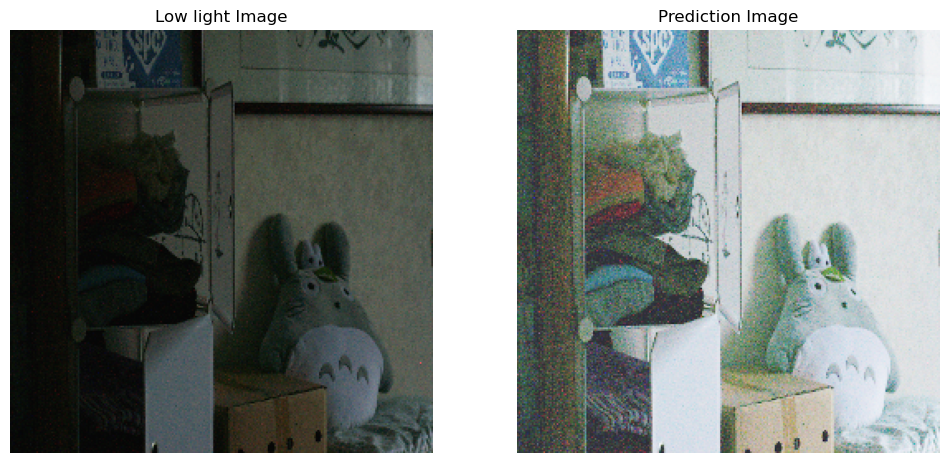

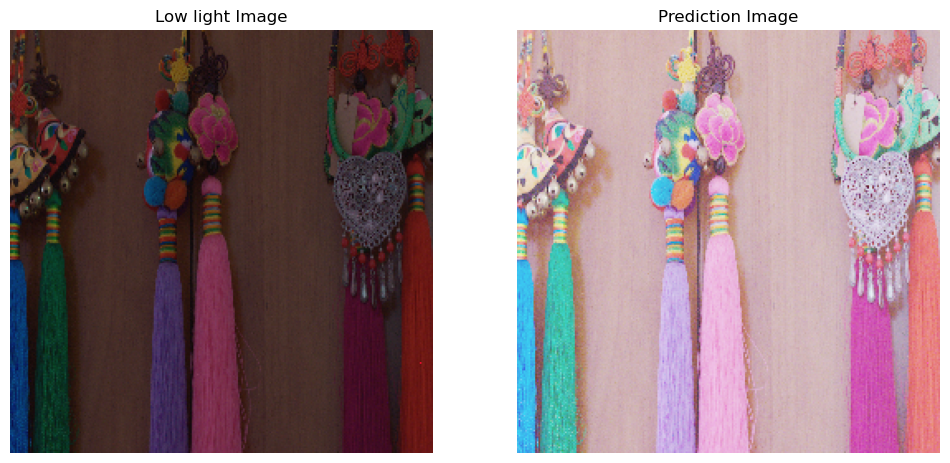

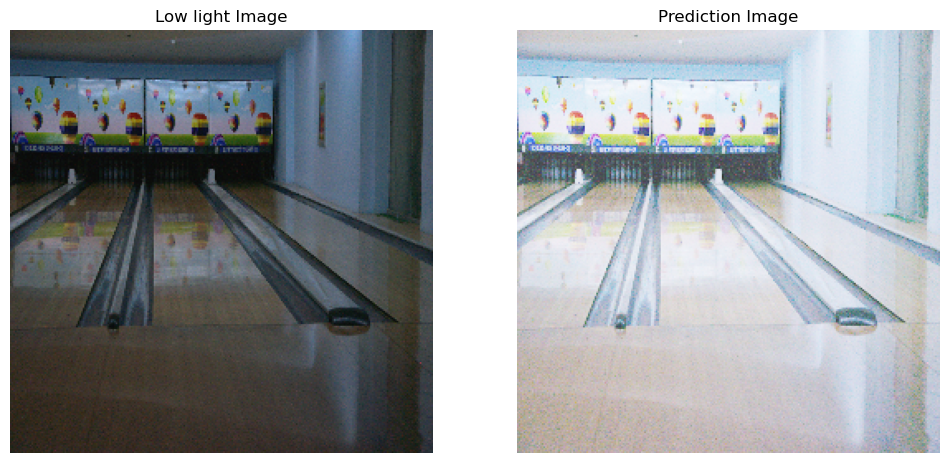

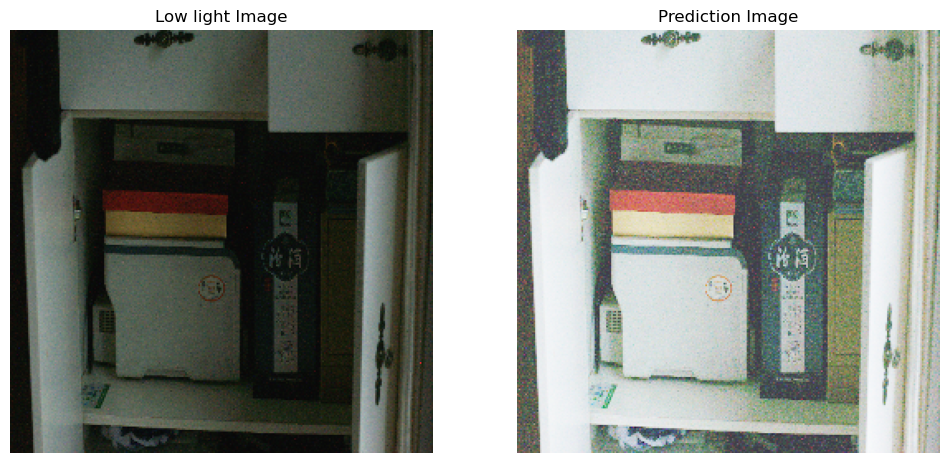

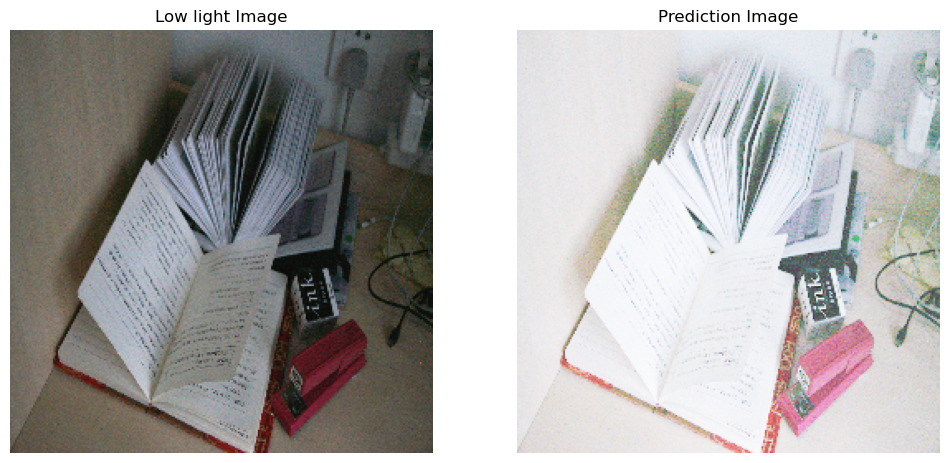

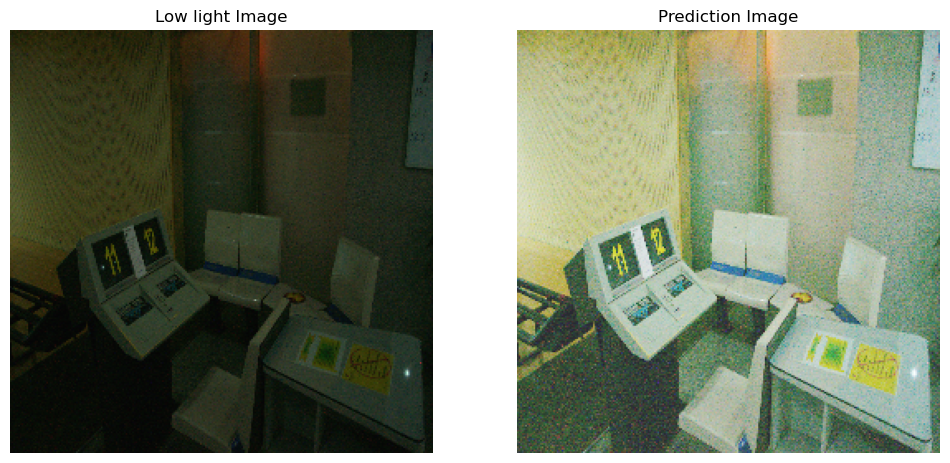

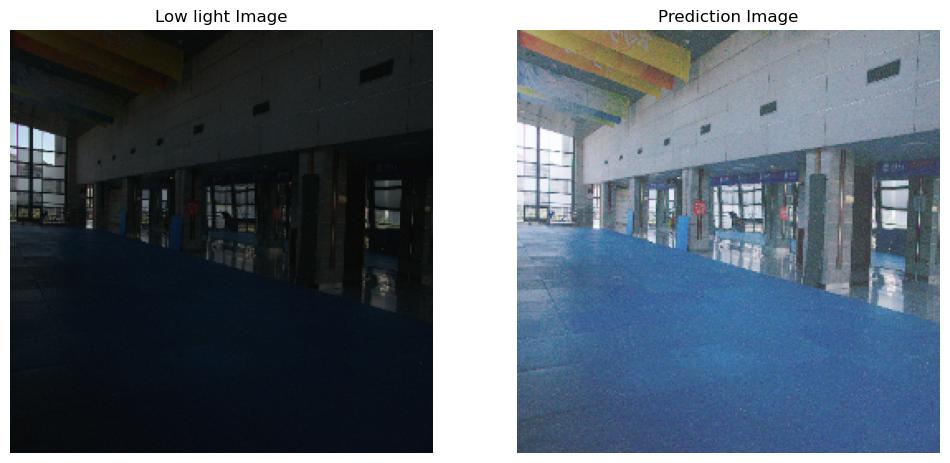

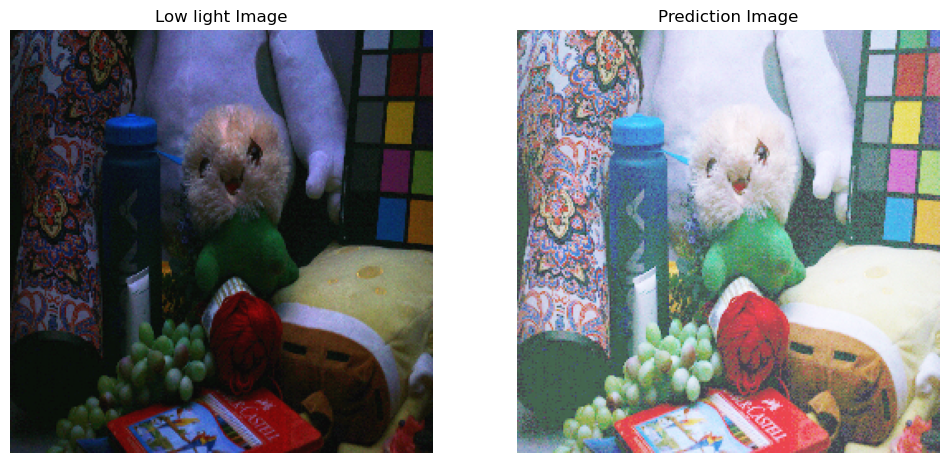

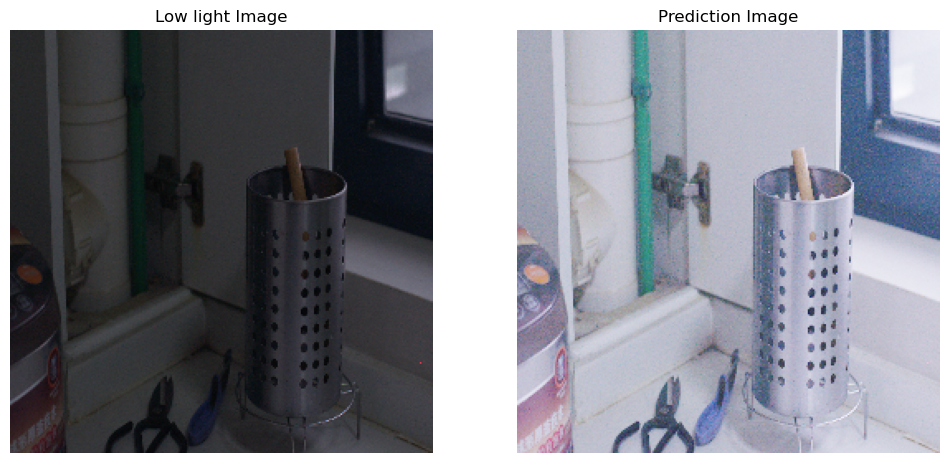

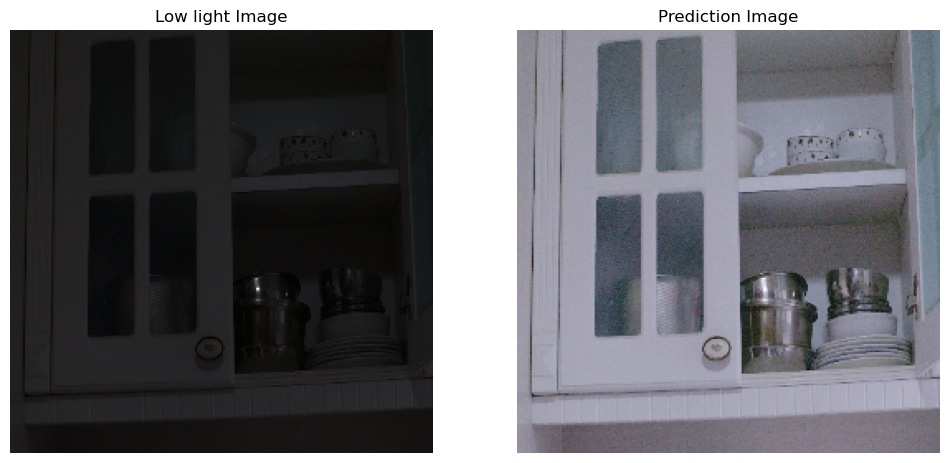

In [17]:
def plot_res(low_light_img, ground_truth, prediction_img):
    plt.subplot(121)
    plt.imshow(low_light_img)
    plt.title("Low light Image")
    plt.axis("off")
    
  #  plt.subplot(132)
   # plt.imshow(ground_truth)
    #plt.title("Ground truth Image")
    
    plt.subplot(122)
    plt.imshow(prediction_img)
    plt.title("Prediction Image")
    plt.axis("off")
    plt.show()
    

for low_light_img_batch in val_ds.take(10):
    for low_light_img  in low_light_img_batch: 
        plt.figure(figsize=(12, 12))
        prediction_img = trainer.model(tf.expand_dims(low_light_img, axis=0))
        plot_res(low_light_img, None, prediction_img[0])

In [37]:
!git clone https://github.com/tuvovan/Zero_DCE_TF.git

Cloning into 'Zero_DCE_TF'...
remote: Enumerating objects: 164, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 164 (delta 22), reused 18 (delta 18), pack-reused 135
Receiving objects: 100% (164/164), 26.74 MiB | 20.31 MiB/s, done.
Resolving deltas: 100% (77/77), done.


In [39]:
lowlight_test_images_path = 'Zero_DCE_TF/test/LIME/'

In [44]:
for test_file in glob.glob(lowlight_test_images_path + "*.bmp"):
    print(test_file.split("/")[-1])
    filename = test_file.split("/")[-1]
    data_lowlight_path = test_file
    original_img = Image.open(data_lowlight_path)
    original_size = (np.array(original_img).shape[1], np.array(original_img).shape[0])

    original_img = original_img.resize((256, 256)) 
    original_img = (np.asarray(original_img)/255.0)

    img_lowlight = Image.open(data_lowlight_path)
                
    img_lowlight = img_lowlight.resize((256, 256))

    img_lowlight = (np.asarray(img_lowlight)/255.0) 
    img_lowlight = np.expand_dims(img_lowlight, 0)
    img_lowlight = tf.convert_to_tensor(img_lowlight, dtype=tf.float32)

    enhanced_image = trainer.model(img_lowlight)
 
    enhanced_image = tf.cast((enhanced_image[0,:,:,:] * 255), dtype=np.uint8)
    enhanced_image = Image.fromarray(enhanced_image.numpy())
    enhanced_image.save(f"results/{filename}")

9.bmp
7.bmp
10.bmp
2.bmp
3.bmp
5.bmp
4.bmp
6.bmp
8.bmp
1.bmp


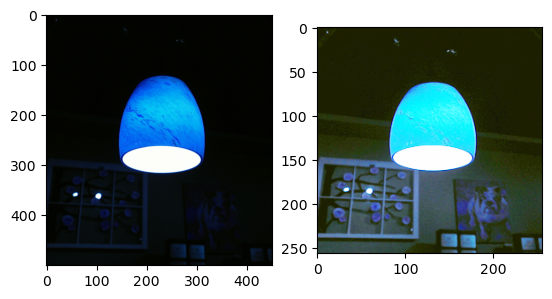

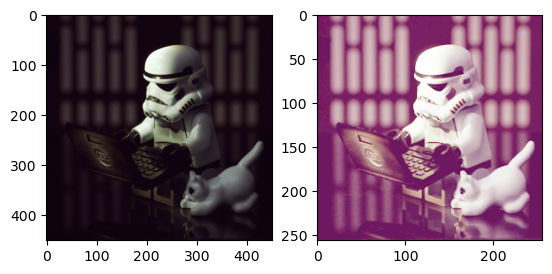

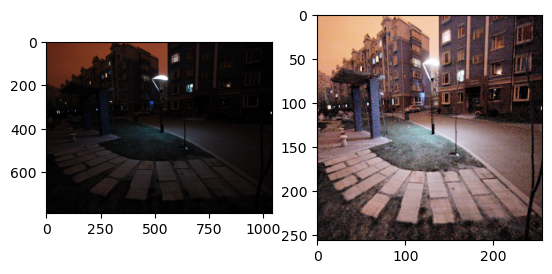

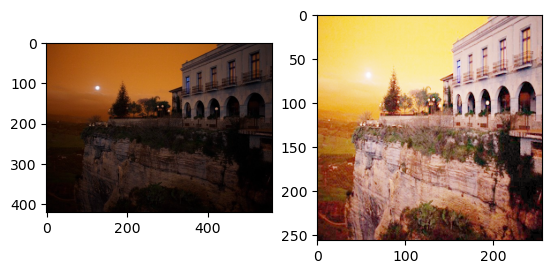

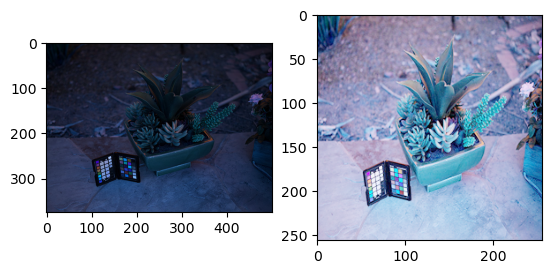

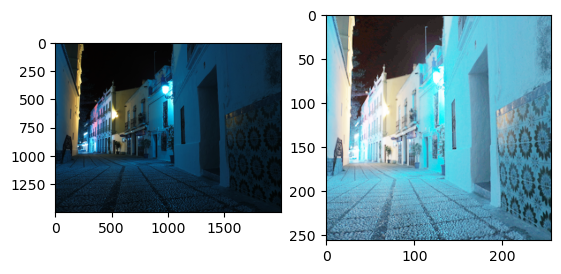

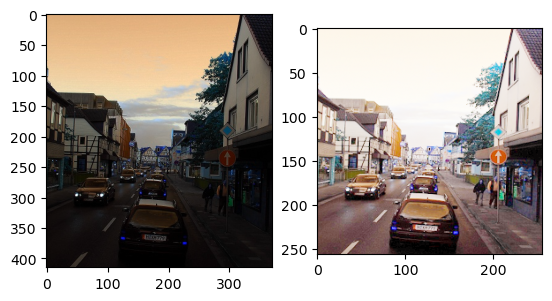

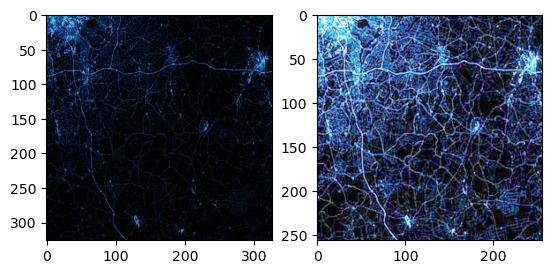

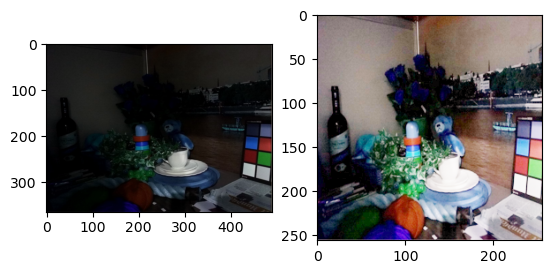

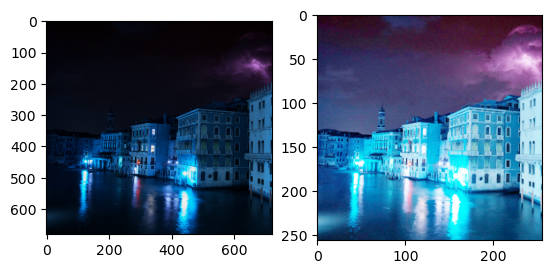

In [48]:
for test_file in (glob.glob(lowlight_test_images_path + "*.bmp")):
    filename = test_file.split("/")[-1]
    plt.figure()
    ll_img = cv2.imread(f"{lowlight_test_images_path}{filename}")
    plt.subplot(121)
    plt.imshow(ll_img/255.0)
    
    enchanced_img = cv2.imread(f"results/{filename}")
    plt.subplot(122)
    plt.imshow(enchanced_img/255.0)

In [56]:
class ZeroDCELite(keras.Model):
    def __init__(self, n_filters, input_img_shape=(256, 256, 3)):
        super(ZeroDCELite, self).__init__()
        
        self.input_img_shape = input_img_shape
        self.n_filters = n_filters
        self.depth_conv_1 = SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        self.depth_conv_2 = SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        self.depth_conv_3 = SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        self.depth_conv_4 = SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        self.depth_conv_5 = SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        self.depth_conv_6 =SeparableConv2D(
            filters=self.n_filters,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
            
        # concatenation layer
        self.concat = Concatenate(axis=-1, name="concat_layer")
        self.A = SeparableConv2D(
            filters=24,
            kernel_size=(3, 3),
            strides=(1, 1),
            padding='same',
            activation='relu',
            depth_multiplier=1,
            depthwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02),
            pointwise_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02))
        
    def call(self, input_img, training=False):
        conv_1 = self.depth_conv_1(input_img)
        conv_2 = self.depth_conv_2(conv_1)
        conv_3 = self.depth_conv_3(conv_2)
        conv_4 = self.depth_conv_4(conv_3)
        
        concat_1 = self.concat([conv_4, conv_3])
        conv_5 = self.depth_conv_5(concat_1)
        
        concat_2 = self.concat([conv_5, conv_2])
        conv_6 = self.depth_conv_6(concat_2)
        
        concat_3 = self.concat([conv_6, conv_1])
        A = self.A(concat_3)
        
        enchanced_image = self.gen_enchanced_image(input_img, A)
        
        if training:
            return enchanced_image, A
        return enchanced_image
    
    def gen_enchanced_image(self, input_img, curve_params):
        A = curve_params
        r1 = A[:,:,:,: 3]
        r2 = A[:,:,:,3: 6]
        r3 = A[:,:,:,6: 9]
        r4 = A[:,:,:,9: 12]
        r5 = A[:,:,:,12: 15]
        r6 = A[:,:,:,15: 18]
        r7 = A[:,:,:,18: 21]
        r8 = A[:,:,:,21: 24]
        
        x = input_img + r1 * (tf.pow(input_img,2)-input_img)
        x = x + r2 * (tf.pow(x,2)-x)
        x = x + r3 * (tf.pow(x,2)-x)
        enhanced_image_1 = x + r4*(tf.pow(x,2)-x)
        x = enhanced_image_1 + r5*(tf.pow(enhanced_image_1,2)-enhanced_image_1)		
        x = x + r6*(tf.pow(x,2)-x)	
        x = x + r7*(tf.pow(x,2)-x)
        enhanced_image = x + r8*(tf.pow(x,2)-x)
        
        return enhanced_image

    def summary(self):
        inputs = Input(shape=self.input_img_shape)
        return Model(inputs=inputs, outputs=self.call(inputs)).summary()

In [57]:
zerodce_lite = ZeroDCELite(32)

In [ ]:
zerodce_lite.summary()

In [58]:
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model = ZeroDCELite(32)


checkpoint = tf.train.Checkpoint(optimizer=optimizer, model=model, epoch=tf.Variable(1))
manager = tf.train.CheckpointManager(
    checkpoint, directory="saved/zerodce_lite", max_to_keep=5)
status = checkpoint.restore(manager.latest_checkpoint)



In [59]:
trainer = Trainer(model, optimizer, checkpoint, manager, 100)
trained_model = trainer.train(train_ds, val_ds)

Initializing from scratch.
Epoch: 0: 


100%|██████████| 16/16 [00:28<00:00,  1.80s/it]


train_loss: 1.9737451076507568, exposure_loss: 1.956472396850586, color_constancy_loss: 0.01727243885397911, illumination_smoothness_loss: 3.2587138543149763e-10, spatial_consistency_loss: 4.516867565737548e-15

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 2: saved/zerodce_lite/ckpt-1
Epoch: 1: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.959370732307434, exposure_loss: 1.943129062652588, color_constancy_loss: 0.016241606324911118, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 2: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.9793187379837036, exposure_loss: 1.9626067876815796, color_constancy_loss: 0.016711771488189697, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995264001190662, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 4: saved/zerodce_lite/ckpt-2
Epoch: 3: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9703007936477661, exposure_loss: 1.951827049255371, color_constancy_loss: 0.01847374625504017, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 4: 


100%|██████████| 16/16 [00:25<00:00,  1.58s/it]


train_loss: 1.9755737781524658, exposure_loss: 1.958695888519287, color_constancy_loss: 0.016878027468919754, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 6: saved/zerodce_lite/ckpt-3
Epoch: 5: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9738019704818726, exposure_loss: 1.957093596458435, color_constancy_loss: 0.016708388924598694, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 6: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.956382155418396, exposure_loss: 1.9373090267181396, color_constancy_loss: 0.01907336339354515, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 8: saved/zerodce_lite/ckpt-4
Epoch: 7: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9777252674102783, exposure_loss: 1.961128830909729, color_constancy_loss: 0.01659613661468029, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 8: 


100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


train_loss: 1.9854122400283813, exposure_loss: 1.967061996459961, color_constancy_loss: 0.018350206315517426, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 10: saved/zerodce_lite/ckpt-5
Epoch: 9: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9844970703125, exposure_loss: 1.9674783945083618, color_constancy_loss: 0.017018761485815048, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 10: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.9517608880996704, exposure_loss: 1.935291051864624, color_constancy_loss: 0.016469681635499, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 12: saved/zerodce_lite/ckpt-6
Epoch: 11: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9648078680038452, exposure_loss: 1.9472565650939941, color_constancy_loss: 0.017551444470882416, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 12: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9836899042129517, exposure_loss: 1.9668595790863037, color_constancy_loss: 0.016830459237098694, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 14: saved/zerodce_lite/ckpt-7
Epoch: 13: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.963289737701416, exposure_loss: 1.9464908838272095, color_constancy_loss: 0.016798730939626694, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 14: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9813404083251953, exposure_loss: 1.964845061302185, color_constancy_loss: 0.016495099291205406, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 16: saved/zerodce_lite/ckpt-8
Epoch: 15: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9664090871810913, exposure_loss: 1.9500540494918823, color_constancy_loss: 0.016355101019144058, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 16: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.977451205253601, exposure_loss: 1.9603636264801025, color_constancy_loss: 0.0170875433832407, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 18: saved/zerodce_lite/ckpt-9
Epoch: 17: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9754056930541992, exposure_loss: 1.959221601486206, color_constancy_loss: 0.016183847561478615, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 18: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9789239168167114, exposure_loss: 1.9625718593597412, color_constancy_loss: 0.016352122649550438, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 20: saved/zerodce_lite/ckpt-10
Epoch: 19: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9434971809387207, exposure_loss: 1.927333116531372, color_constancy_loss: 0.01616399735212326, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 20: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9853205680847168, exposure_loss: 1.9690040349960327, color_constancy_loss: 0.01631697453558445, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 22: saved/zerodce_lite/ckpt-11
Epoch: 21: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9573798179626465, exposure_loss: 1.9412381649017334, color_constancy_loss: 0.01614183560013771, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 22: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.96848464012146, exposure_loss: 1.9517253637313843, color_constancy_loss: 0.016758980229496956, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 24: saved/zerodce_lite/ckpt-12
Epoch: 23: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.954845905303955, exposure_loss: 1.938524603843689, color_constancy_loss: 0.016321267932653427, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 24: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9762990474700928, exposure_loss: 1.960091471672058, color_constancy_loss: 0.016207613050937653, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 26: saved/zerodce_lite/ckpt-13
Epoch: 25: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.9670379161834717, exposure_loss: 1.950649619102478, color_constancy_loss: 0.016388170421123505, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 26: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.9611749649047852, exposure_loss: 1.944416880607605, color_constancy_loss: 0.016757914796471596, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 28: saved/zerodce_lite/ckpt-14
Epoch: 27: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.996976375579834, exposure_loss: 1.98024320602417, color_constancy_loss: 0.01673313044011593, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 28: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.9846028089523315, exposure_loss: 1.9679267406463623, color_constancy_loss: 0.016675904393196106, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 30: saved/zerodce_lite/ckpt-15
Epoch: 29: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9607919454574585, exposure_loss: 1.9440242052078247, color_constancy_loss: 0.01676797680556774, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 30: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.9877839088439941, exposure_loss: 1.9712125062942505, color_constancy_loss: 0.016571180894970894, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 32: saved/zerodce_lite/ckpt-16
Epoch: 31: 


100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


train_loss: 1.9421089887619019, exposure_loss: 1.9254764318466187, color_constancy_loss: 0.016632523387670517, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 32: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.956076979637146, exposure_loss: 1.9392143487930298, color_constancy_loss: 0.016862777993083, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 34: saved/zerodce_lite/ckpt-17
Epoch: 33: 


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


train_loss: 1.9899466037750244, exposure_loss: 1.9731152057647705, color_constancy_loss: 0.016831589862704277, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 34: 


100%|██████████| 16/16 [00:25<00:00,  1.59s/it]


train_loss: 1.954968810081482, exposure_loss: 1.9382582902908325, color_constancy_loss: 0.016710640862584114, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769004344940186, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 36: saved/zerodce_lite/ckpt-18
Epoch: 35: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9561882019042969, exposure_loss: 1.9389259815216064, color_constancy_loss: 0.01726241409778595, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 36: 


100%|██████████| 16/16 [00:25<00:00,  1.59s/it]


train_loss: 1.9595670700073242, exposure_loss: 1.9411064386367798, color_constancy_loss: 0.01846078597009182, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 38: saved/zerodce_lite/ckpt-19
Epoch: 37: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.987851858139038, exposure_loss: 1.9708278179168701, color_constancy_loss: 0.017023984342813492, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 38: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.979843020439148, exposure_loss: 1.9630604982376099, color_constancy_loss: 0.016782574355602264, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 40: saved/zerodce_lite/ckpt-20
Epoch: 39: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9600307941436768, exposure_loss: 1.943217158317566, color_constancy_loss: 0.016813578084111214, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 40: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9698179960250854, exposure_loss: 1.953542947769165, color_constancy_loss: 0.016275014728307724, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.87690007686615, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 42: saved/zerodce_lite/ckpt-21
Epoch: 41: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.960155963897705, exposure_loss: 1.9430357217788696, color_constancy_loss: 0.01712038554251194, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 42: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.9381177425384521, exposure_loss: 1.9214210510253906, color_constancy_loss: 0.016696704551577568, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 44: saved/zerodce_lite/ckpt-22
Epoch: 43: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9805734157562256, exposure_loss: 1.9634227752685547, color_constancy_loss: 0.01715080998837948, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 44: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.9621180295944214, exposure_loss: 1.944658875465393, color_constancy_loss: 0.01745925098657608, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868952989578247, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 46: saved/zerodce_lite/ckpt-23
Epoch: 45: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9414501190185547, exposure_loss: 1.9244695901870728, color_constancy_loss: 0.016980523243546486, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 46: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.968260407447815, exposure_loss: 1.9517773389816284, color_constancy_loss: 0.016482995823025703, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 48: saved/zerodce_lite/ckpt-24
Epoch: 47: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.972562313079834, exposure_loss: 1.9553284645080566, color_constancy_loss: 0.01723393052816391, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.87690007686615, val_color_constancy_loss: 0.009995264001190662, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 48: 


100%|██████████| 16/16 [00:25<00:00,  1.59s/it]


train_loss: 1.955868124961853, exposure_loss: 1.93890380859375, color_constancy_loss: 0.016964038833975792, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 50: saved/zerodce_lite/ckpt-25
Epoch: 49: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.956861138343811, exposure_loss: 1.9406007528305054, color_constancy_loss: 0.016260454431176186, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 50: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9503933191299438, exposure_loss: 1.933946132659912, color_constancy_loss: 0.01644718460738659, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 52: saved/zerodce_lite/ckpt-26
Epoch: 51: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.991765022277832, exposure_loss: 1.9753808975219727, color_constancy_loss: 0.016384197399020195, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995264001190662, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 52: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9520407915115356, exposure_loss: 1.9348682165145874, color_constancy_loss: 0.017172327265143394, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 54: saved/zerodce_lite/ckpt-27
Epoch: 53: 


100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


train_loss: 1.9766223430633545, exposure_loss: 1.9601415395736694, color_constancy_loss: 0.016480572521686554, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 54: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9582284688949585, exposure_loss: 1.939207673072815, color_constancy_loss: 0.01902095228433609, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 56: saved/zerodce_lite/ckpt-28
Epoch: 55: 


100%|██████████| 16/16 [00:25<00:00,  1.59s/it]


train_loss: 1.9768881797790527, exposure_loss: 1.9604953527450562, color_constancy_loss: 0.016392463818192482, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 56: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.9523526430130005, exposure_loss: 1.9361071586608887, color_constancy_loss: 0.016245322301983833, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 58: saved/zerodce_lite/ckpt-29
Epoch: 57: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.950600028038025, exposure_loss: 1.934512734413147, color_constancy_loss: 0.016087228432297707, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 58: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9715595245361328, exposure_loss: 1.9543602466583252, color_constancy_loss: 0.017199251800775528, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 60: saved/zerodce_lite/ckpt-30
Epoch: 59: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9458198547363281, exposure_loss: 1.9293845891952515, color_constancy_loss: 0.01643526740372181, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 60: 


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


train_loss: 1.9483362436294556, exposure_loss: 1.9313124418258667, color_constancy_loss: 0.017023807391524315, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 62: saved/zerodce_lite/ckpt-31
Epoch: 61: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9805394411087036, exposure_loss: 1.9637830257415771, color_constancy_loss: 0.016756586730480194, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 62: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.982033371925354, exposure_loss: 1.965087652206421, color_constancy_loss: 0.01694568619132042, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 64: saved/zerodce_lite/ckpt-32
Epoch: 63: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9584542512893677, exposure_loss: 1.9413502216339111, color_constancy_loss: 0.01710437424480915, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 64: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9739445447921753, exposure_loss: 1.9575375318527222, color_constancy_loss: 0.016407033428549767, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 66: saved/zerodce_lite/ckpt-33
Epoch: 65: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.9692035913467407, exposure_loss: 1.9520149230957031, color_constancy_loss: 0.01718863472342491, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 66: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9842499494552612, exposure_loss: 1.9664411544799805, color_constancy_loss: 0.017808809876441956, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769004344940186, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 68: saved/zerodce_lite/ckpt-34
Epoch: 67: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9860297441482544, exposure_loss: 1.969724178314209, color_constancy_loss: 0.016305498778820038, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 68: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9617561101913452, exposure_loss: 1.945395588874817, color_constancy_loss: 0.01636049896478653, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 70: saved/zerodce_lite/ckpt-35
Epoch: 69: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9595277309417725, exposure_loss: 1.9416861534118652, color_constancy_loss: 0.017841557040810585, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 70: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9549236297607422, exposure_loss: 1.93876314163208, color_constancy_loss: 0.01616048254072666, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 72: saved/zerodce_lite/ckpt-36
Epoch: 71: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.9749735593795776, exposure_loss: 1.957817792892456, color_constancy_loss: 0.017155660316348076, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 72: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.96628737449646, exposure_loss: 1.9491022825241089, color_constancy_loss: 0.017185218632221222, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.87690007686615, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 74: saved/zerodce_lite/ckpt-37
Epoch: 73: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.973516821861267, exposure_loss: 1.9573471546173096, color_constancy_loss: 0.016169646754860878, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 74: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.969207763671875, exposure_loss: 1.9526087045669556, color_constancy_loss: 0.016599060967564583, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 76: saved/zerodce_lite/ckpt-38
Epoch: 75: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9507336616516113, exposure_loss: 1.934571385383606, color_constancy_loss: 0.01616222970187664, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995261207222939, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 76: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9872236251831055, exposure_loss: 1.9710582494735718, color_constancy_loss: 0.0161653570830822, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 78: saved/zerodce_lite/ckpt-39
Epoch: 77: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9795676469802856, exposure_loss: 1.9627299308776855, color_constancy_loss: 0.01683766581118107, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 78: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9736897945404053, exposure_loss: 1.956918478012085, color_constancy_loss: 0.016771307215094566, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868956565856934, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 80: saved/zerodce_lite/ckpt-40
Epoch: 79: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9573793411254883, exposure_loss: 1.940228819847107, color_constancy_loss: 0.017150642350316048, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 80: 


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


train_loss: 1.9671586751937866, exposure_loss: 1.9503790140151978, color_constancy_loss: 0.016779670491814613, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 82: saved/zerodce_lite/ckpt-41
Epoch: 81: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9735488891601562, exposure_loss: 1.9542624950408936, color_constancy_loss: 0.01928636245429516, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 82: 


100%|██████████| 16/16 [00:25<00:00,  1.58s/it]


train_loss: 1.9953937530517578, exposure_loss: 1.978168249130249, color_constancy_loss: 0.017225610092282295, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 84: saved/zerodce_lite/ckpt-42
Epoch: 83: 


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


train_loss: 1.9580248594284058, exposure_loss: 1.941900610923767, color_constancy_loss: 0.01612454280257225, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 84: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9542410373687744, exposure_loss: 1.937403917312622, color_constancy_loss: 0.016837038099765778, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 86: saved/zerodce_lite/ckpt-43
Epoch: 85: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.969581961631775, exposure_loss: 1.952816128730774, color_constancy_loss: 0.016766132786870003, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 86: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9557390213012695, exposure_loss: 1.9383447170257568, color_constancy_loss: 0.017394283786416054, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 88: saved/zerodce_lite/ckpt-44
Epoch: 87: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9692448377609253, exposure_loss: 1.9525684118270874, color_constancy_loss: 0.016676291823387146, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 88: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9789248704910278, exposure_loss: 1.9618229866027832, color_constancy_loss: 0.01710169017314911, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 90: saved/zerodce_lite/ckpt-45
Epoch: 89: 


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


train_loss: 1.98345947265625, exposure_loss: 1.9659591913223267, color_constancy_loss: 0.017500106245279312, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868954181671143, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 90: 


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


train_loss: 1.9644055366516113, exposure_loss: 1.9479649066925049, color_constancy_loss: 0.016440514475107193, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 92: saved/zerodce_lite/ckpt-46
Epoch: 91: 


100%|██████████| 16/16 [00:26<00:00,  1.66s/it]


train_loss: 1.9537323713302612, exposure_loss: 1.9371275901794434, color_constancy_loss: 0.016604945063591003, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 92: 


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


train_loss: 1.9614654779434204, exposure_loss: 1.9441471099853516, color_constancy_loss: 0.017318498343229294, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 94: saved/zerodce_lite/ckpt-47
Epoch: 93: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9834665060043335, exposure_loss: 1.966172218322754, color_constancy_loss: 0.017294416204094887, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 94: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9908136129379272, exposure_loss: 1.9738982915878296, color_constancy_loss: 0.01691521890461445, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 96: saved/zerodce_lite/ckpt-48
Epoch: 95: 


100%|██████████| 16/16 [00:25<00:00,  1.61s/it]


train_loss: 1.9914655685424805, exposure_loss: 1.9744032621383667, color_constancy_loss: 0.017062360420823097, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.8769001960754395, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 96: 


100%|██████████| 16/16 [00:25<00:00,  1.62s/it]


train_loss: 1.9668445587158203, exposure_loss: 1.9506125450134277, color_constancy_loss: 0.01623203605413437, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 98: saved/zerodce_lite/ckpt-49
Epoch: 97: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9622143507003784, exposure_loss: 1.9452202320098877, color_constancy_loss: 0.016993984580039978, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.87690007686615, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Epoch: 98: 


100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


train_loss: 1.9733493328094482, exposure_loss: 1.9567923545837402, color_constancy_loss: 0.016556987538933754, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995263069868088, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0

Saved checkpoint for step 100: saved/zerodce_lite/ckpt-50
Epoch: 99: 


100%|██████████| 16/16 [00:26<00:00,  1.64s/it]


train_loss: 1.9816911220550537, exposure_loss: 1.9644325971603394, color_constancy_loss: 0.01725853607058525, illumination_smoothness_loss: 0.0, spatial_consistency_loss: 0.0

val_loss: 1.8868955373764038, val_exposure_loss: 1.876900315284729, val_color_constancy_loss: 0.009995262138545513, val_illumination_smoothness_loss: 0.0, val_spatial_consistency_loss: 0.0



In [60]:
trainer.save_weights(filepath="pretrained_weights/zero_dcenet_lite.h5")

In [62]:
lowlight_test_images_path = 'Zero_DCE_TF/test/LIME/'

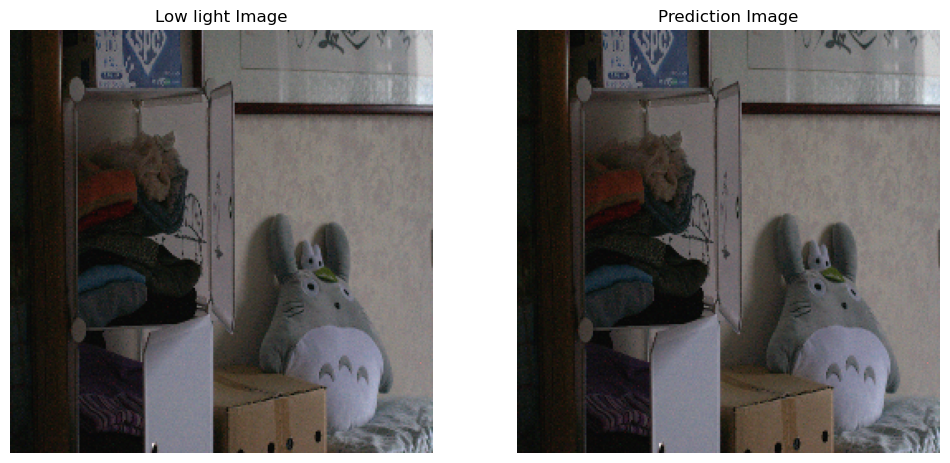

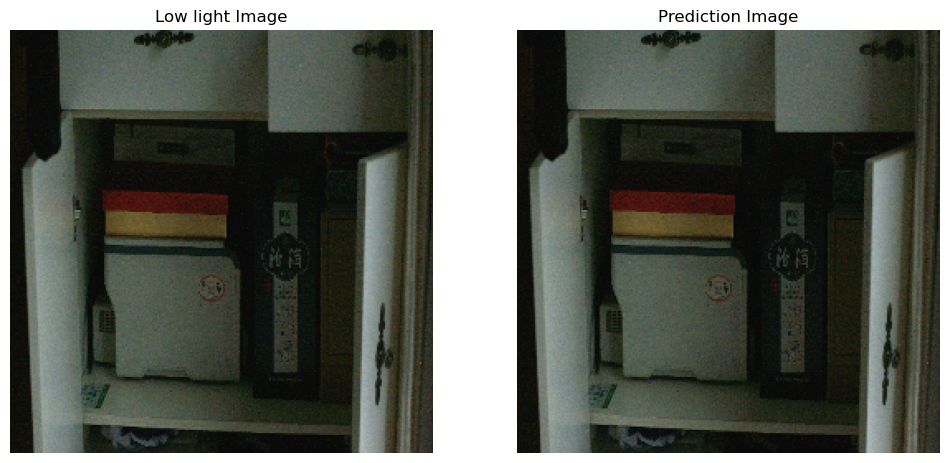

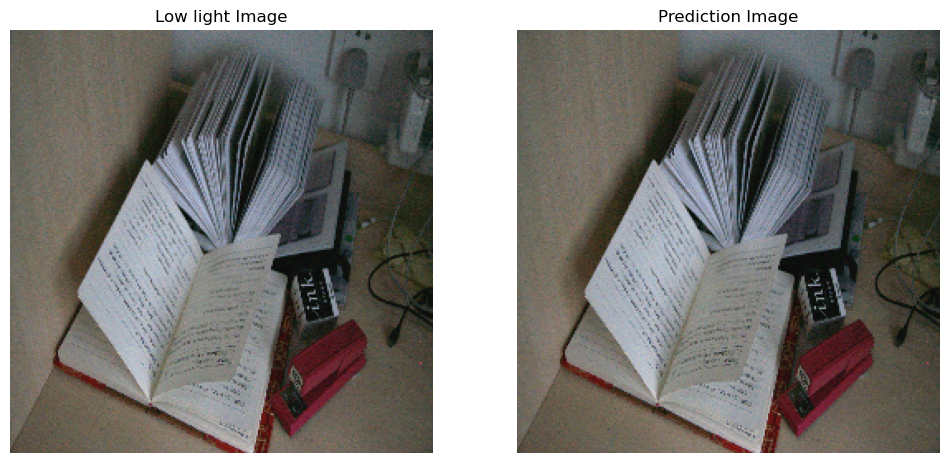

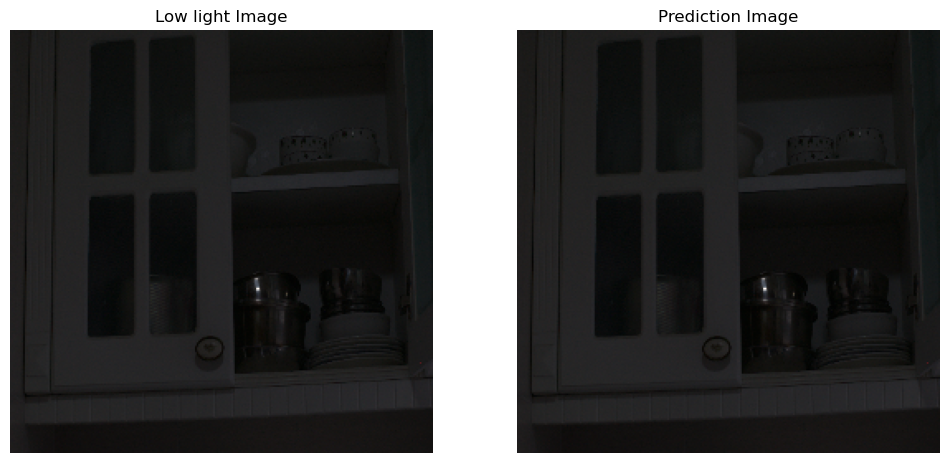

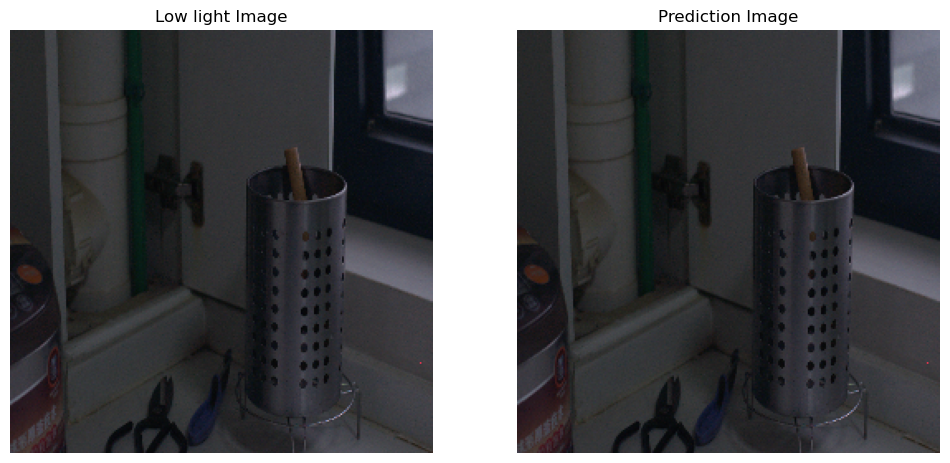

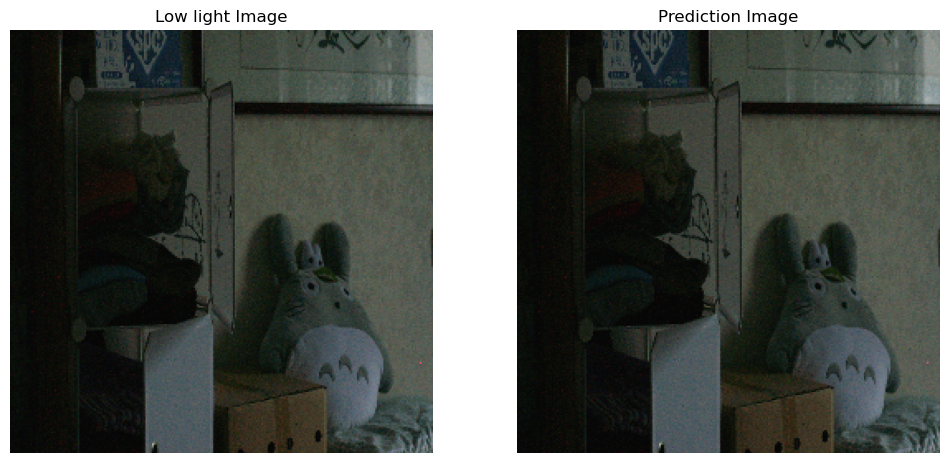

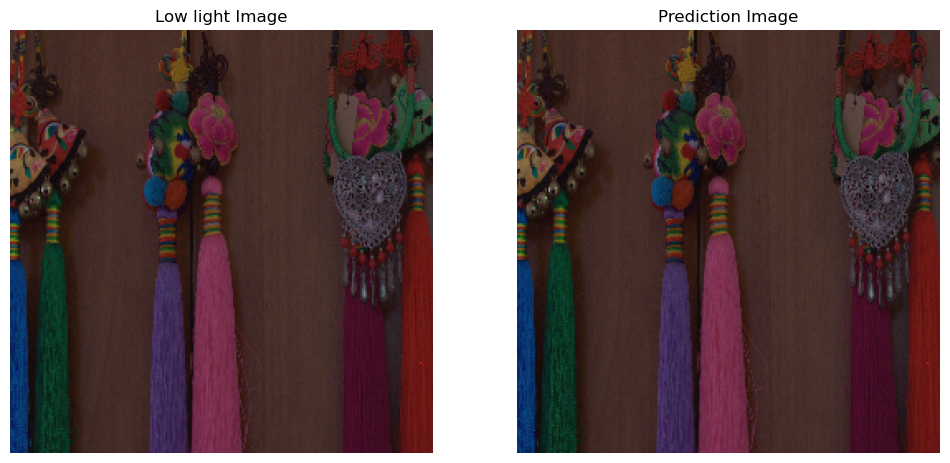

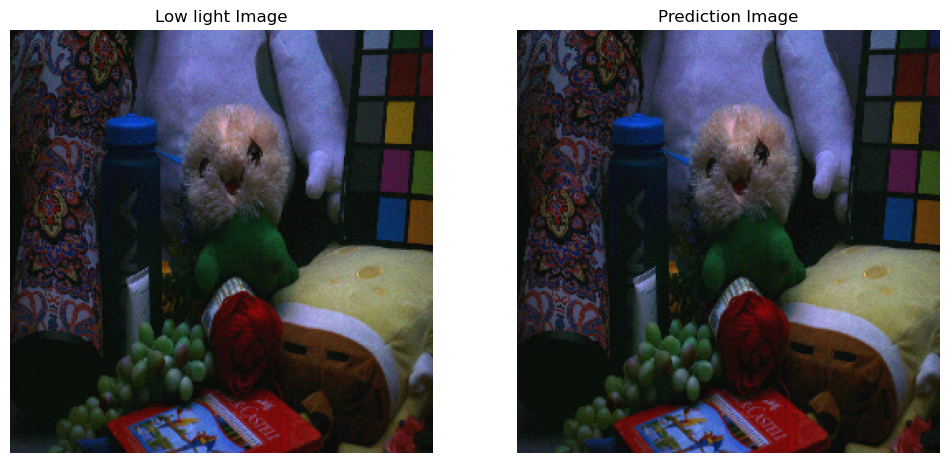

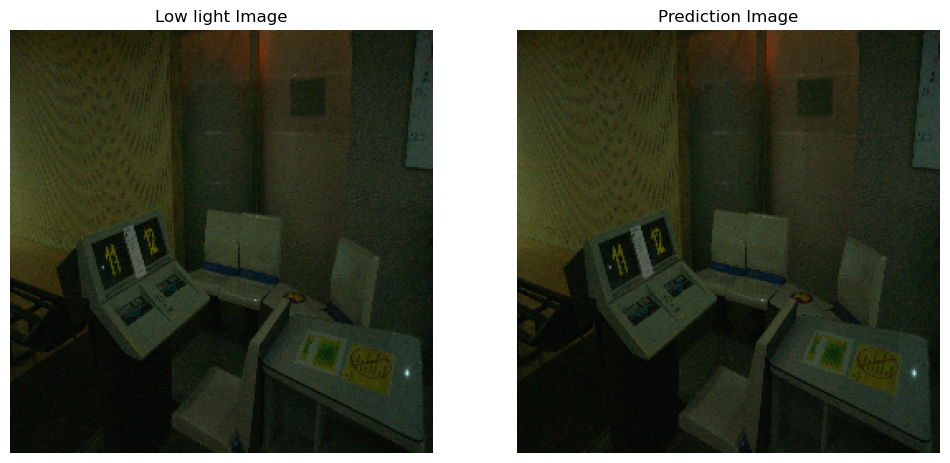

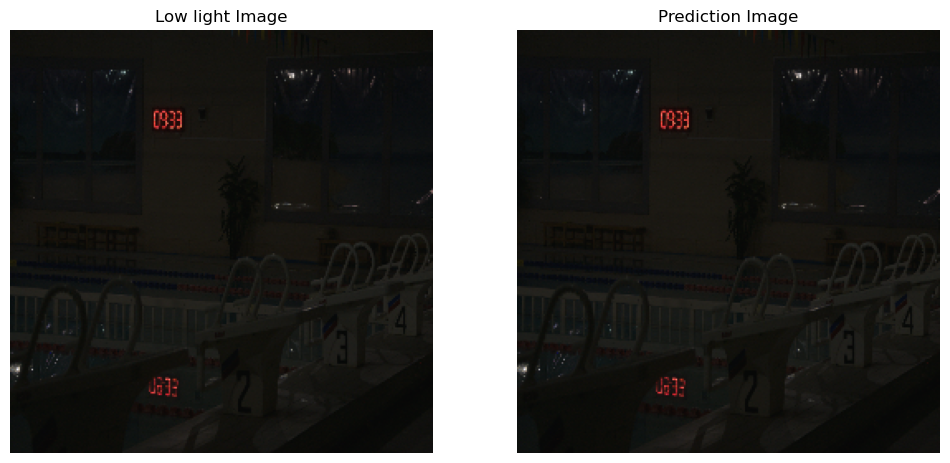

In [66]:
def plot_res(low_light_img, ground_truth, prediction_img):
    plt.subplot(121)
    plt.imshow(low_light_img)
    plt.title("Low light Image")
    plt.axis("off")
    
  #  plt.subplot(132)
   # plt.imshow(ground_truth)
    #plt.title("Ground truth Image")
    
    plt.subplot(122)
    plt.imshow(prediction_img)
    plt.title("Prediction Image")
    plt.axis("off")
    plt.show()
    

for low_light_img_batch in val_ds.take(10):
    for low_light_img  in low_light_img_batch: 
        plt.figure(figsize=(12, 12))
        prediction_img = trainer.model(tf.expand_dims(low_light_img, axis=0))
        plot_res(low_light_img, None, prediction_img[0])

In [64]:
for test_file in glob.glob(lowlight_test_images_path + "*.bmp"):
    print(test_file.split("/")[-1])
    filename = test_file.split("/")[-1]
    data_lowlight_path = test_file
    original_img = Image.open(data_lowlight_path)
    original_size = (np.array(original_img).shape[1], np.array(original_img).shape[0])

    original_img = original_img.resize((256, 256)) 
    original_img = (np.asarray(original_img)/255.0)

    img_lowlight = Image.open(data_lowlight_path)
                
    img_lowlight = img_lowlight.resize((256, 256))

    img_lowlight = (np.asarray(img_lowlight)/255.0) 
    img_lowlight = np.expand_dims(img_lowlight, 0)
    img_lowlight = tf.convert_to_tensor(img_lowlight, dtype=tf.float32)

    enhanced_image = trainer.model(img_lowlight)
 
    enhanced_image = tf.cast((enhanced_image[0,:,:,:] * 255), dtype=np.uint8)
    enhanced_image = Image.fromarray(enhanced_image.numpy())
    enhanced_image.save(f"results_lite/{filename}")

9.bmp
7.bmp
10.bmp
2.bmp
3.bmp
5.bmp
4.bmp
6.bmp
8.bmp
1.bmp


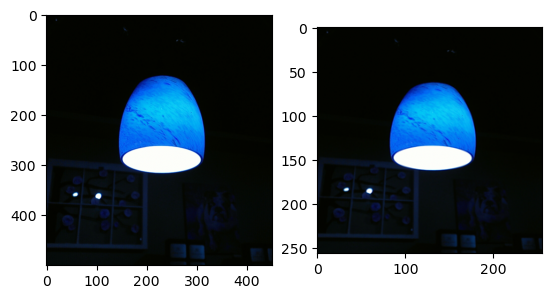

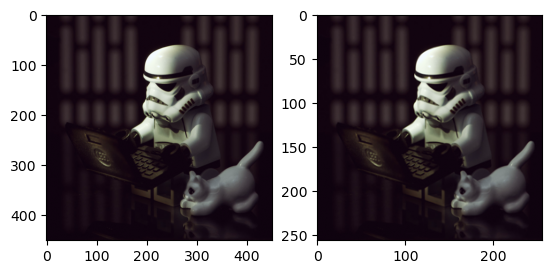

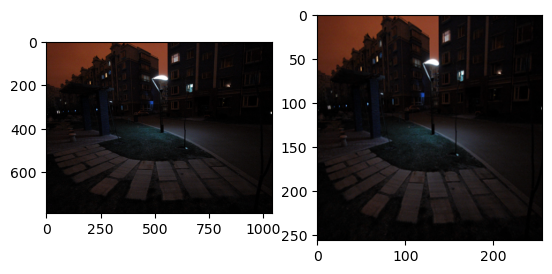

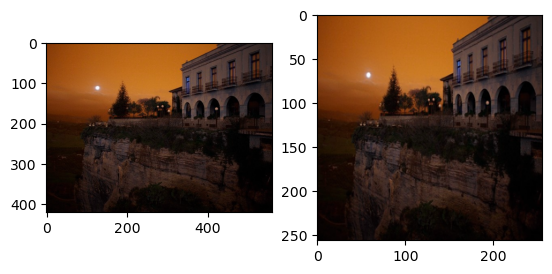

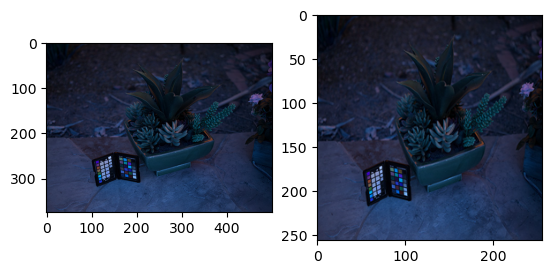

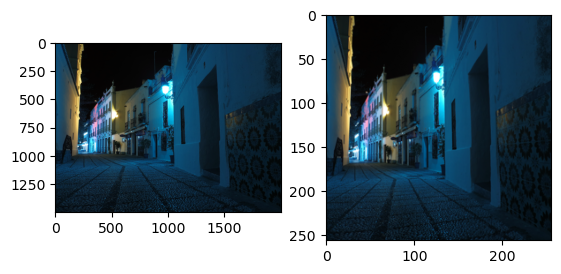

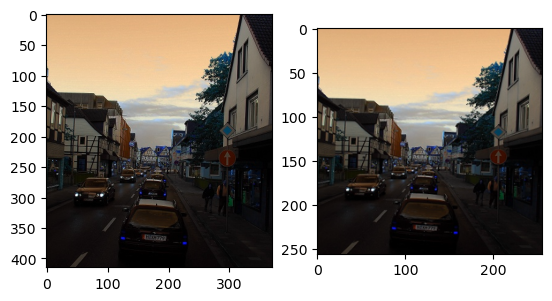

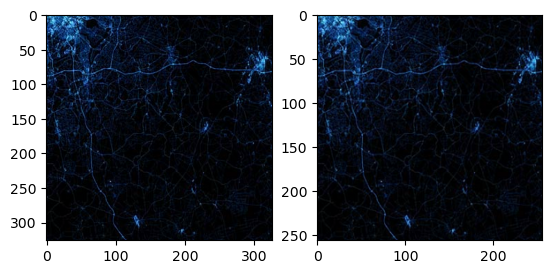

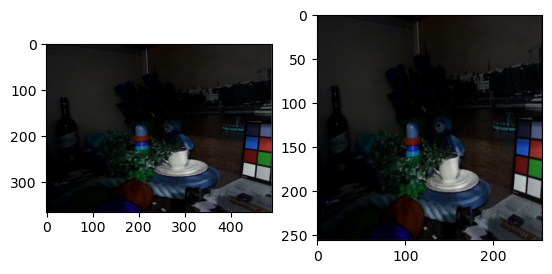

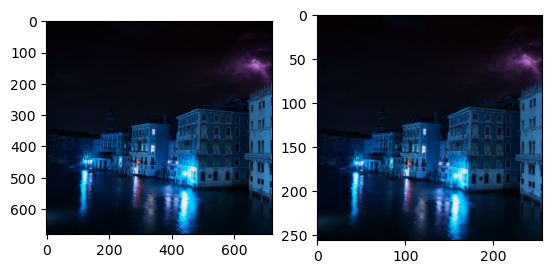

In [65]:
for test_file in (glob.glob(lowlight_test_images_path + "*.bmp")):
    filename = test_file.split("/")[-1]
    plt.figure()
    ll_img = cv2.imread(f"{lowlight_test_images_path}{filename}")
    plt.subplot(121)
    plt.imshow(ll_img/255.0)
    
    enchanced_img = cv2.imread(f"results_lite/{filename}")
    plt.subplot(122)
    plt.imshow(enchanced_img/255.0)

In [53]:
INPUT_SHAPE=(256, 256, 3)

MODEL_PATH = "pretrained_weights/zero_dcenet.h5"
TFLITE_MODEL_PATH = '.pretrained_weights/zerodce.tflite'

def main(input_shape, quantize=False):
    
    model = get_zero_dce(input_shape, 32)
    model.load_weights(MODEL_PATH)

    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    
    if quantize:
        converter.optimizations = [tf.lite.Optimize.DEFAULT]
        
    tflite_model = converter.convert()
    with open(TFLITE_MODEL_PATH, 'wb') as f:
        f.write(tflite_model)

In [78]:
!tar -zcvf zerodce_data.tar.gz zerodce_data/

zerodce_data/
zerodce_data/saved/
zerodce_data/saved/zerodce_lite/
zerodce_data/saved/zerodce_lite/ckpt-48.index
zerodce_data/saved/zerodce_lite/ckpt-46.index
zerodce_data/saved/zerodce_lite/ckpt-47.data-00000-of-00001
zerodce_data/saved/zerodce_lite/ckpt-48.data-00000-of-00001
zerodce_data/saved/zerodce_lite/ckpt-49.data-00000-of-00001
zerodce_data/saved/zerodce_lite/ckpt-47.index
zerodce_data/saved/zerodce_lite/checkpoint
zerodce_data/saved/zerodce_lite/ckpt-50.index
zerodce_data/saved/zerodce_lite/ckpt-46.data-00000-of-00001
zerodce_data/saved/zerodce_lite/ckpt-49.index
zerodce_data/saved/zerodce_lite/ckpt-50.data-00000-of-00001
zerodce_data/saved/zerodce_new/
zerodce_data/saved/zerodce_new/ckpt-79.data-00000-of-00001
zerodce_data/saved/zerodce_new/ckpt-82.data-00000-of-00001
zerodce_data/saved/zerodce_new/ckpt-81.data-00000-of-00001
zerodce_data/saved/zerodce_new/ckpt-79.index
zerodce_data/saved/zerodce_new/ckpt-82.index
zerodce_data/saved/zerodce_new/ckpt-83.index
zerodce_data/sav